In [1]:
import os
import os.path
import glob
import numpy as np
from tqdm import tqdm
import math
import warnings
import argparse
import time
import shutil

#Numpy,matplotlib,etc.
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
from IPython.display import Image

#Astropy
from astropy.visualization import ZScaleInterval
import astropy
from astropy.io import fits
import astropy.stats as stat
from astropy.stats import mad_std
from astropy.stats import sigma_clip
from astropy.modeling import models, fitting
from astropy.convolution import convolve
from astropy.visualization import SimpleNorm

from scipy.ndimage import shift
from scipy.signal import fftconvolve
from scipy.ndimage import gaussian_filter
import scipy.signal

import photutils.psf_matching as psf
from photutils.utils import calc_total_error
from photutils.psf import CircularGaussianSigmaPRF
from photutils.psf_matching import make_kernel, make_wiener_kernel, SplitCosineBellWindow
from photutils.aperture import aperture_photometry, ApertureStats, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder
from photutils.profiles import CurveOfGrowth

from skimage.registration import phase_cross_correlation

/opt/anaconda3/envs/Perkins/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def get_psf(target_image,star_bound,background_bound,size):
    '''
    This function takes the centroid of the area specified in a reference image (intended to be one star), 
    then takes the centroid of the same area in the specified list of images, 
    and calculates the shifts required to map them to the reference image.
    Inputs:
    ref_image (str): the filepath of the reference image
    target_image (str): the filepath of the target image
    star_bound (np array): the bounds for the box of which to centroid, in [[xmin,xmax],[ymin,ymax]] form
    background_bound (np array): the bounds for the box of which to calculate the background from, in [[xmin,xmax],[ymin,ymax]] form
    Outputs:
    xy_shift (list): the x and y shifts for the target image
    '''
    
    #Calculate the shifts as compared to the reference centroid
    
    #Set our sum arrays to nothing
    img_x_weight = []
    img_y_weight = []
    img_no_weight = []
        
    #Converting the fits to a np.array
    img_fits = fits.getdata(target_image)

    #Extracing star+background patches
    img_background = img_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
    img_star = img_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]
    #Calculating the background
    bg_med = np.nanmedian(img_background)
    bg_std = np.nanstd(img_background)
    threshhold = bg_med + 3*bg_std
    print(threshhold)
    # img_reduced = img_star - bg_med

    #plt.imshow(img_star,vmin=-1,vmax=5)
    #plt.colorbar()
        
    #Nested for loops for x/y weighted pixels
    for x in np.arange(0,img_star.shape[1]):
        for y in np.arange(0,img_star.shape[0]):
            if img_star[x,y] > threshhold:
                x_weight = (img_star[x,y]-bg_med)*x
                y_weight = (img_star[x,y]-bg_med)*y
                no_weight= img_star[x,y]-bg_med
                img_x_weight.append(x_weight)
                img_y_weight.append(y_weight)
                img_no_weight.append(no_weight)
                
    #Calculate the image's centroid
    print(sum(img_x_weight))
    print(sum(img_no_weight))
    img_x_centroid = sum(img_x_weight)/sum(img_no_weight)
    img_y_centroid = sum(img_y_weight)/sum(img_no_weight)
    img_centroid = [img_y_centroid,img_x_centroid]
    print(img_centroid)
    starbox = img_star[int(img_x_centroid)-size:int(img_x_centroid)+size+1, int(img_y_centroid)-size:int(img_y_centroid)+size+1]
    plt.imshow(starbox)
    plt.scatter(size+1,size+1, color='red',s=3)
    plt.colorbar



    y, x, = np.mgrid[:size*2+1, :size*2+1]
    f_init = models.Gaussian2D(amplitude = starbox[size+1,size+1]-np.median(img_background),x_mean=int(size+1), y_mean = int(size+1))
    fit_f = fitting.LevMarLSQFitter()

    f = fit_f(f_init, x, y, starbox-np.median(img_background))
    std_devs = np.array([f.x_stddev[0],f.y_stddev[0]])
    fwhm = 2.335*std_devs
    fwhm = np.sqrt(fwhm[0]**2+fwhm[1]**2)

    psf_fin = f(x,y)/np.sum(f(x,y))


    return img_centroid, psf_fin, starbox, fwhm
        
    # #Calculate the x/y shifts, print them, and add them to the list
    # x_shift = ref_centroid[0] - img_centroid[0]
    # y_shift = ref_centroid[1] - img_centroid[1]
    # xy_shift = [x_shift,y_shift]
#    # return xy_shift

In [3]:
# def get_psf1(target_image,star_bound,background_bound,size):
#     '''
#     This function takes the centroid of the area specified in a reference image (intended to be one star), 
#     then takes the centroid of the same area in the specified list of images, 
#     and calculates the shifts required to map them to the reference image.
#     Inputs:
#     ref_image (str): the filepath of the reference image
#     target_image (str): the filepath of the target image
#     star_bound (np array): the bounds for the box of which to centroid, in [[xmin,xmax],[ymin,ymax]] form
#     background_bound (np array): the bounds for the box of which to calculate the background from, in [[xmin,xmax],[ymin,ymax]] form
#     Outputs:
#     xy_shift (list): the x and y shifts for the target image
#     '''
    
#     #Calculate the shifts as compared to the reference centroid
    
#     #Set our sum arrays to nothing
#     img_x_weight = []
#     img_y_weight = []
#     img_no_weight = []
        
#     #Converting the fits to a np.array
#     img_fits = fits.getdata(target_image)

#     #Extracing star+background patches
#     img_background = img_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
#     img_star = img_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]
        
#     #Calculating the background
#     img_median = np.median(img_background)
        
#     #Nested for loops for x/y weighted pixels
#     for x in np.arange(0,img_star.shape[1]):
#         print(x)
#         for y in np.arange(0,img_star.shape[0]):
#             img_x_weight.append((img_star[x,y]-img_median)*x)
#             img_y_weight.append((img_star[x,y]-img_median)*y)
#             img_no_weight.append(img_star[x,y]-img_median)
                
#     #Calculate the image's centroid
#     img_x_centroid = sum(img_x_weight)/sum(img_no_weight)
#     img_y_centroid = sum(img_y_weight)/sum(img_no_weight)
#     img_centroid = [img_x_centroid,img_y_centroid]
#     print(img_centroid)
#     starbox = img_star[int(img_x_centroid)-size:int(img_x_centroid)+size+1, int(img_y_centroid)-size:int(img_y_centroid)+size+1]
#     plt.imshow(starbox)



#     y, x, = np.mgrid[:size*2+1, :size*2+1]
#     f_init = models.Gaussian2D(amplitude = starbox[int(img_x_centroid),int(img_y_centroid)]-np.median(img_background),x_mean=int(img_x_centroid), y_mean = int(img_y_centroid))
#     fit_f = fitting.LevMarLSQFitter()

#     f = fit_f(f_init, x, y, starbox-np.median(img_background))
#     std_devs = np.array([f.x_stddev[0],f.y_stddev[0]])
#     fwhm = 2.335*std_devs

#     psf_fin = f(x,y)/np.sum(f(x,y))


#     return img_centroid, psf_fin, starbox, fwhm
        
#     # #Calculate the x/y shifts, print them, and add them to the list
#     # x_shift = ref_centroid[0] - img_centroid[0]
#     # y_shift = ref_centroid[1] - img_centroid[1]
#     # xy_shift = [x_shift,y_shift]
#     # return xy_shift

In [4]:
name1 = "/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaON/registered_New H Alpha (On).fits"
name2 = "/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaOFF/registered_New H Alpha (Off).fits"
name3 = "/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/B/registered_B.fits"
star_bound = [[925,1025],[968,1068]]
bg_bound = [[900,1000],[850,950]]


1.3565820292860489
76152.67288882531
1601.3540947971146
[np.float64(51.11489431086126), np.float64(47.55517417181461)]
1.3040863745330973
88035.38451707028
1714.230629271637
[np.float64(51.23627692102), np.float64(51.355624508048734)]
27.03867225694216 24.2970697597659
hi


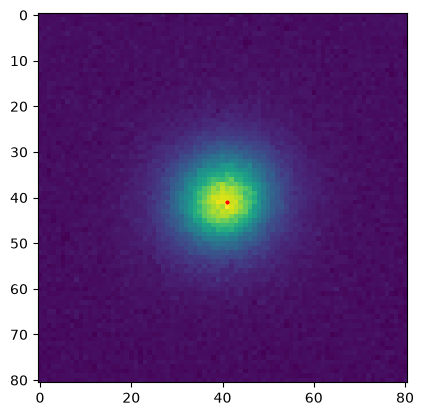

In [5]:
cent1, psf1, starbox1, fwhm1 = get_psf(name1, star_bound, bg_bound,40)
cent2, psf2, starbox2, fwhm2 = get_psf(name2, star_bound, bg_bound,40)
print(fwhm1, fwhm2)

#kernel1 = make_kernel(psf1,psf2)
kernellap = make_wiener_kernel(psf1,psf2, penalty="laplacian", regularization=1.082e-5) #1e-5 works! Keep messing around with penalty and regularization. (make a loop to try variety of values per image?)
kernel2 = make_wiener_kernel(psf1,psf2, penalty = 'biharmonic', regularization=1.082e-5)

match1 = fftconvolve(psf1,kernellap,mode='same')
match2 = fftconvolve(psf1,kernel2,mode='same')

print("hi")

1.07e-5
0.03372972671234815
1.071e-5
0.034080118980702075
1.0719999999999998e-5
0.03443012886760944
1.0729999999999997e-5
0.03477975698394155
1.0739999999999996e-5
0.03512900393924135
1.0749999999999995e-5
0.03547787034175798
1.0759999999999994e-5
0.03582635679843057
1.0769999999999993e-5
0.036174463914923724
1.0779999999999992e-5
0.036522192295602135
1.078999999999999e-5
0.0368695425435438
1.079999999999999e-5
0.03721651526055215
1.0809999999999989e-5


/var/folders/th/82vh89jd0lj1tv88p7hjcsb00000gn/T/ipykernel_21755/3813555199.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,6))


0.03756311104713353
1.0819999999999987e-5
0.037909330502541305
1.0829999999999986e-5
0.03825517422474037
1.0839999999999985e-5
0.03860064281043117
1.0849999999999984e-5
0.03894573685503193
1.0859999999999983e-5
0.03929045695273132
1.0869999999999982e-5
0.03963480369643655
1.087999999999998e-5
0.03997877767780121
1.088999999999998e-5
0.04032237948722574
1.0899999999999979e-5
0.04066560971386976
0
0.03372972671234815


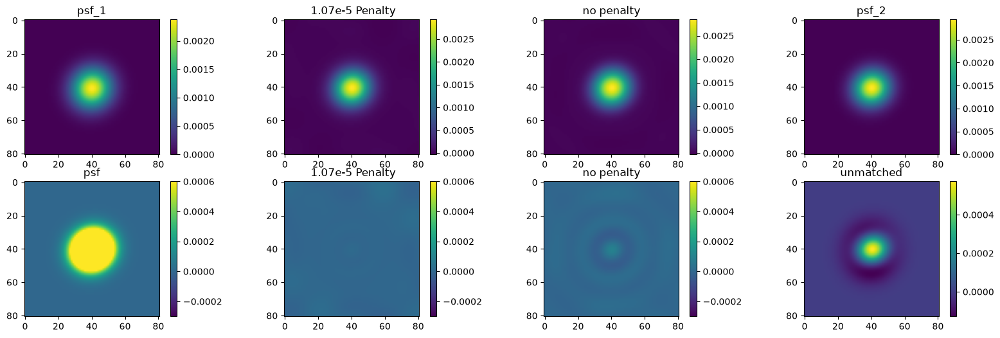

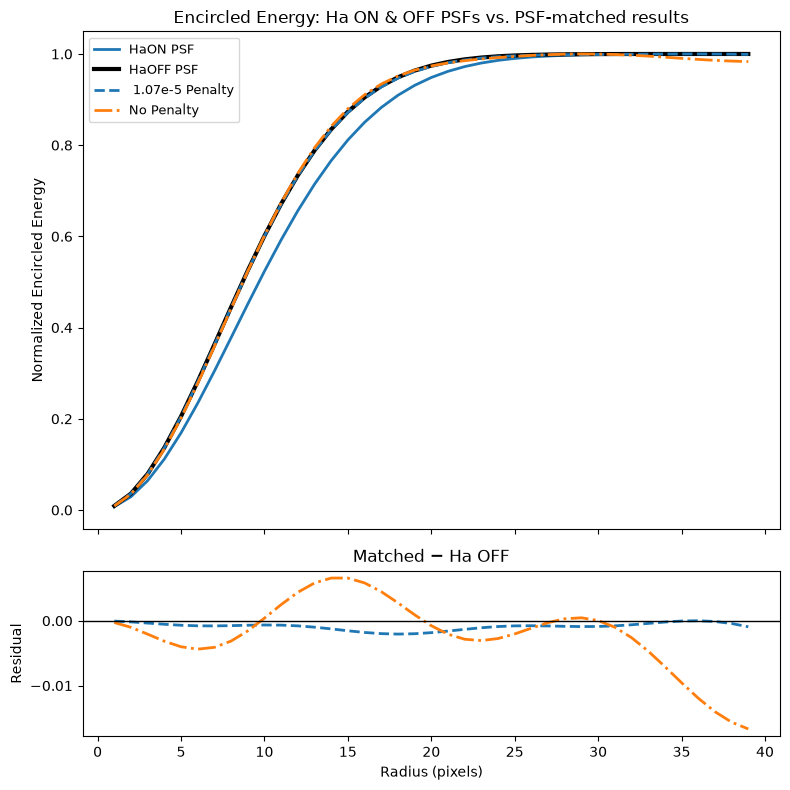

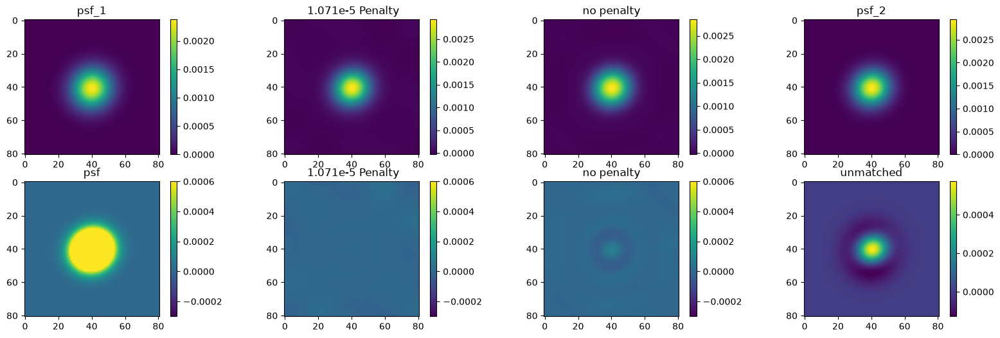

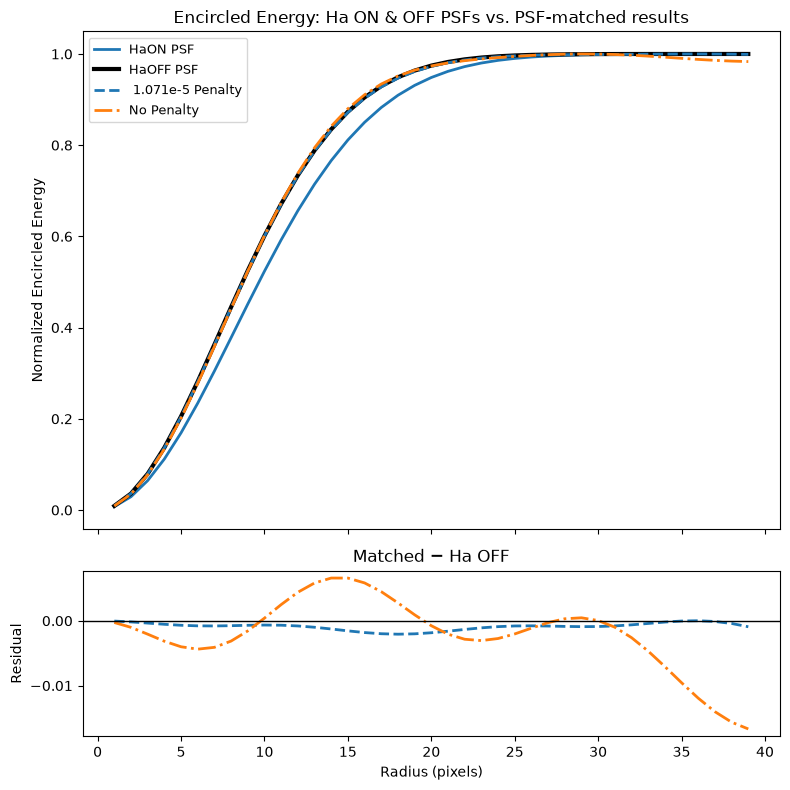

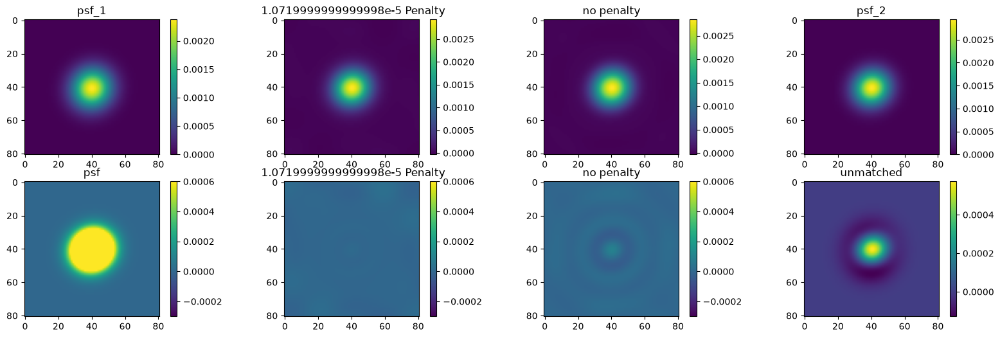

...

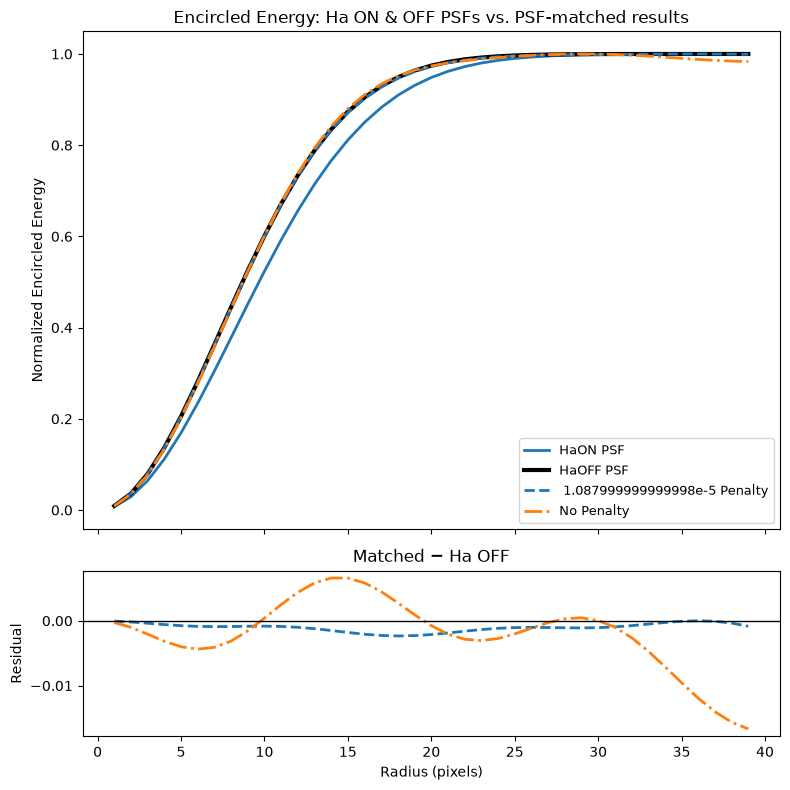

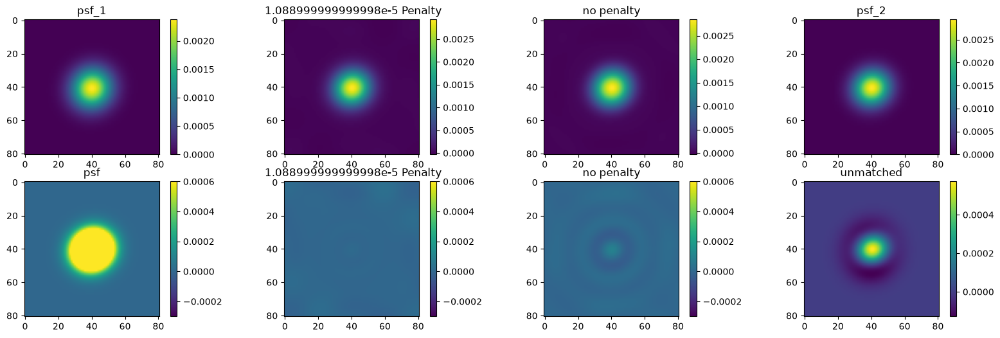

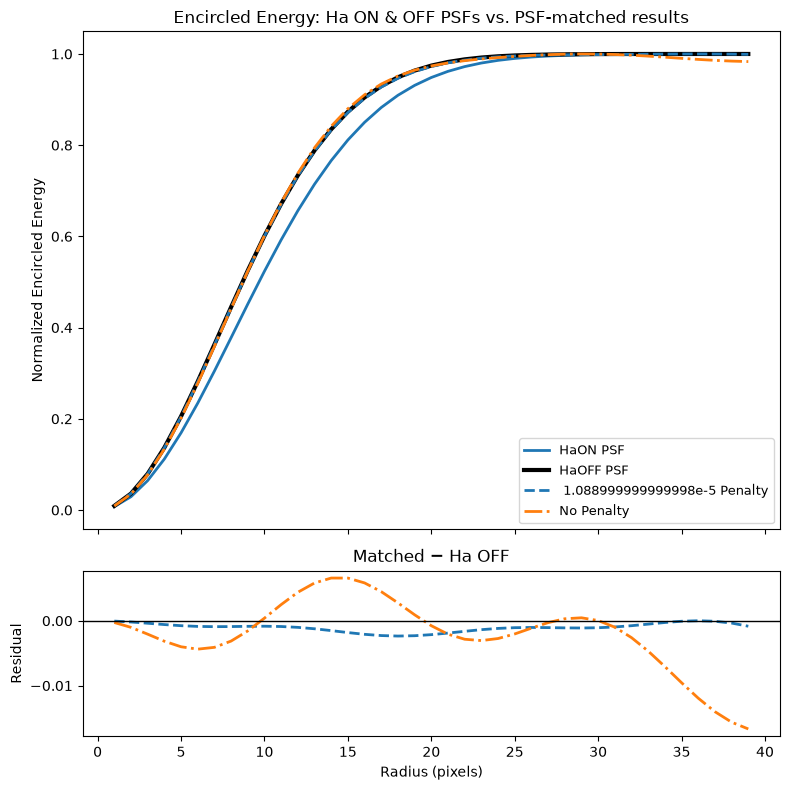

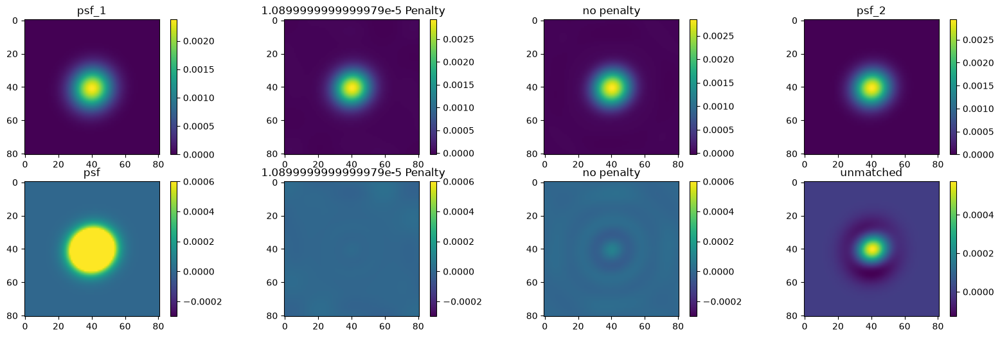

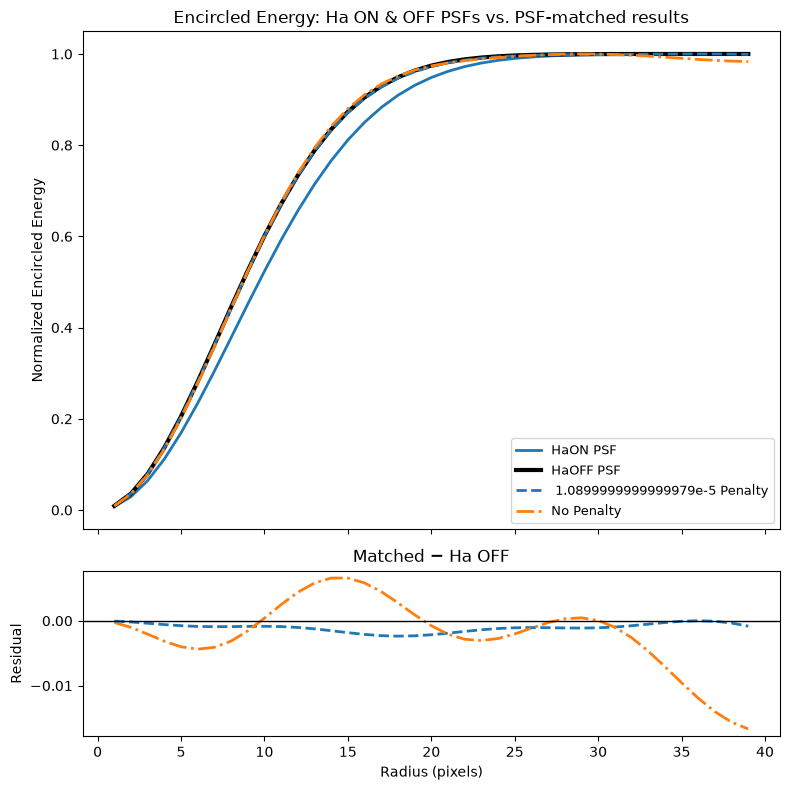

In [6]:
min_res = 0
min_pen = 0

for i in np.arange(1.07,1.09,0.001):

    kernellap = make_wiener_kernel(psf1,psf2, penalty="laplacian", regularization=i*1e-5) #1e-5 works! Keep messing around with penalty and regularization. (make a loop to try variety of values per image?)
    kernel2 = make_wiener_kernel(psf1,psf2)

    match1 = fftconvolve(psf1,kernellap,mode='same')
    match2 = fftconvolve(psf1,kernel2,mode='same')
    print(f"{i}e-5")

    plt.figure(figsize=(20,6))
    plt.subplot(2, 4, 1)
    plt.imshow(psf1)
    plt.colorbar()
    plt.title("psf_1")
    plt.subplot(2, 4, 2)
    plt.imshow(match1)
    plt.colorbar()
    plt.title(f' {i}e-5 Penalty')
    plt.subplot(2,4,3)
    plt.imshow(match2)
    plt.colorbar()
    plt.title("no penalty")
    plt.subplot(2,4,4)
    plt.imshow(psf2)
    plt.colorbar()
    plt.title("psf_2")
    plt.subplot(2, 4, 5)
    plt.imshow(psf2,vmin=-.0003,vmax=.0006)
    plt.colorbar()
    plt.title("psf")
    plt.subplot(2, 4, 6)
    plt.imshow(psf2-match1,vmin=-.0003,vmax=.0006)
    plt.colorbar()
    plt.title(f' {i}e-5 Penalty')
    plt.subplot(2,4,7)
    plt.imshow(psf2-match2,vmin=-.0003,vmax=.0006)
    plt.colorbar()
    plt.title("no penalty")
    plt.subplot(2,4,8)
    plt.imshow(psf2-psf1)
    plt.colorbar()
    plt.title("unmatched")

    xycen = (40.0, 40.0)
    radii = np.arange(1, 40)

    cog_ch1 = CurveOfGrowth(psf1, xycen, radii)
    cog_ch4 = CurveOfGrowth(psf2, xycen, radii)
    cog_m1 = CurveOfGrowth(match1, xycen, radii)
    cog_m2 = CurveOfGrowth(match2, xycen, radii)


    for cog in [cog_ch1, cog_ch4, cog_m1, cog_m2]:
        cog.normalize()

    labels = [
        f' {i}e-5 Penalty',
        'No Penalty'
    ]
    cogs_matched = [cog_m1, cog_m2]
    ls_list = ['--', '-.']

    fig, (ax_top, ax_bot) = plt.subplots(
        nrows=2, figsize=(8, 8),
        gridspec_kw={'height_ratios': [3, 1]},
        sharex=True,
    )

    # Main panel
    cog_ch1.plot(ax=ax_top, label='HaON PSF', lw=2,
                color='C0', ls='-')
    cog_ch4.plot(ax=ax_top, label='HaOFF PSF', lw=3,
                color='k')
    for cog, label, ls in zip(cogs_matched, labels, ls_list):
        cog.plot(ax=ax_top, label=label, lw=2, ls=ls)
    ax_top.set_ylabel('Normalized Encircled Energy')
    ax_top.set_title(
        'Encircled Energy: Ha ON & OFF PSFs vs. PSF-matched results')
    ax_top.legend(fontsize=9)
    ax_top.set_xlabel('')

    # Residual subpanel (matched - ch4)
    for cog, label, ls in zip(cogs_matched, labels, ls_list):
        resid = cog.profile - cog_ch4.profile
        ax_bot.plot(cog.radius, resid, lw=2, ls=ls, label=label)
        if cog == cog_m1:
            print(np.sum(abs(resid)))

            if min_res==0:
                min_res = np.sum(abs(resid))
            elif np.sum(abs(resid)) < min_res:
                min_res = np.sum(abs(resid))
                min_pen = i*1e-5

    ax_bot.axhline(0, color='k', lw=1, ls='-')
    ax_bot.set_xlabel('Radius (pixels)')
    ax_bot.set_ylabel('Residual')
    ax_bot.set_title('Matched $-$ Ha OFF')

    fig.tight_layout()
print(min_pen)
print(min_res)

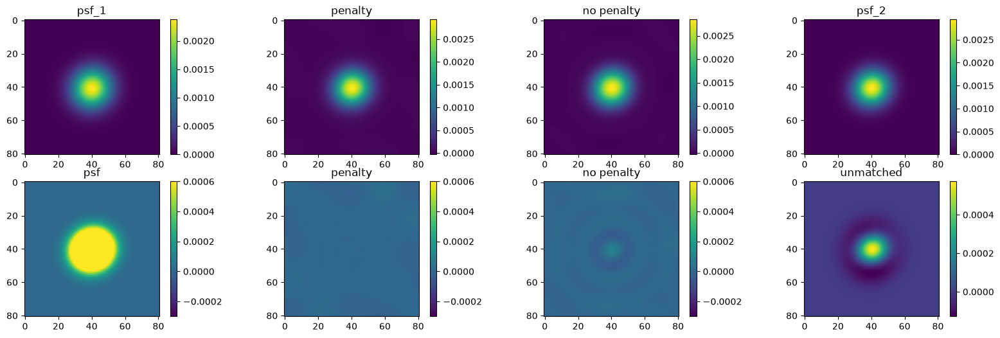

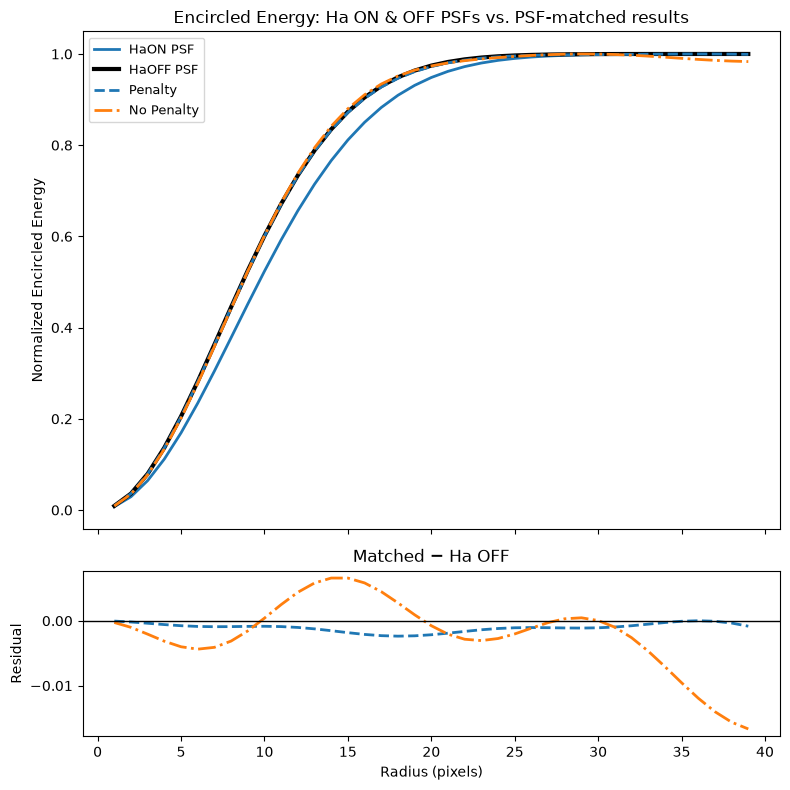

In [7]:
plt.figure(figsize=(20,6))
plt.subplot(2, 4, 1)
plt.imshow(psf1)
plt.colorbar()
plt.title("psf_1")
plt.subplot(2, 4, 2)
plt.imshow(match1)
plt.colorbar()
plt.title("penalty")
plt.subplot(2,4,3)
plt.imshow(match2)
plt.colorbar()
plt.title("no penalty")
plt.subplot(2,4,4)
plt.imshow(psf2)
plt.colorbar()
plt.title("psf_2")
plt.subplot(2, 4, 5)
plt.imshow(psf2,vmin=-.0003,vmax=.0006)
plt.colorbar()
plt.title("psf")
plt.subplot(2, 4, 6)
plt.imshow(psf2-match1,vmin=-.0003,vmax=.0006)
plt.colorbar()
plt.title("penalty")
plt.subplot(2,4,7)
plt.imshow(psf2-match2,vmin=-.0003,vmax=.0006)
plt.colorbar()
plt.title("no penalty")
plt.subplot(2,4,8)
plt.imshow(psf2-psf1)
plt.colorbar()
plt.title("unmatched")

xycen = (40.0, 40.0)
radii = np.arange(1, 40)

cog_ch1 = CurveOfGrowth(psf1, xycen, radii)
cog_ch4 = CurveOfGrowth(psf2, xycen, radii)
cog_m1 = CurveOfGrowth(match1, xycen, radii)
cog_m2 = CurveOfGrowth(match2, xycen, radii)


for cog in [cog_ch1, cog_ch4, cog_m1, cog_m2]:
    cog.normalize()

labels = [
    'Penalty',
    'No Penalty'
]
cogs_matched = [cog_m1, cog_m2]
ls_list = ['--', '-.']

fig, (ax_top, ax_bot) = plt.subplots(
    nrows=2, figsize=(8, 8),
    gridspec_kw={'height_ratios': [3, 1]},
    sharex=True,
)

# Main panel
cog_ch1.plot(ax=ax_top, label='HaON PSF', lw=2,
             color='C0', ls='-')
cog_ch4.plot(ax=ax_top, label='HaOFF PSF', lw=3,
             color='k')
for cog, label, ls in zip(cogs_matched, labels, ls_list):
    cog.plot(ax=ax_top, label=label, lw=2, ls=ls)
ax_top.set_ylabel('Normalized Encircled Energy')
ax_top.set_title(
    'Encircled Energy: Ha ON & OFF PSFs vs. PSF-matched results')
ax_top.legend(fontsize=9)
ax_top.set_xlabel('')

# Residual subpanel (matched - ch4)
for cog, label, ls in zip(cogs_matched, labels, ls_list):
    resid = cog.profile - cog_ch4.profile
    ax_bot.plot(cog.radius, resid, lw=2, ls=ls, label=label)
ax_bot.axhline(0, color='k', lw=1, ls='-')
ax_bot.set_xlabel('Radius (pixels)')
ax_bot.set_ylabel('Residual')
ax_bot.set_title('Matched $-$ Ha OFF')

fig.tight_layout()


In [8]:
data1 = fits.getdata(name1)
data2 = fits.getdata(name2)

In [9]:
newdata1 = convolve(data1, kernellap)

(500.0, 1500.0)

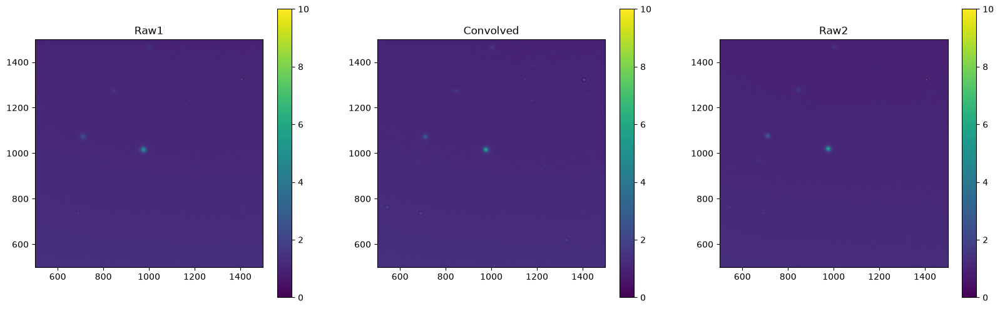

In [10]:
plt.figure(figsize=(20,6))
plt.subplot(1, 3, 1)
plt.imshow(data1,vmin=0, vmax=10)
plt.colorbar()
plt.title("Raw1")
plt.xlim(500,1500)
plt.ylim(500,1500)
plt.subplot(1, 3, 2)
plt.imshow(newdata1,vmin=0,vmax=10)
plt.colorbar()
plt.title("Convolved")
plt.xlim(500,1500)
plt.ylim(500,1500)
plt.subplot(1, 3, 3)
plt.imshow(data2,vmin=0,vmax=10)
plt.colorbar()
plt.title("Raw2")
plt.xlim(500,1500)
plt.ylim(500,1500)

Text(0.5, 1.0, 'unmatched')

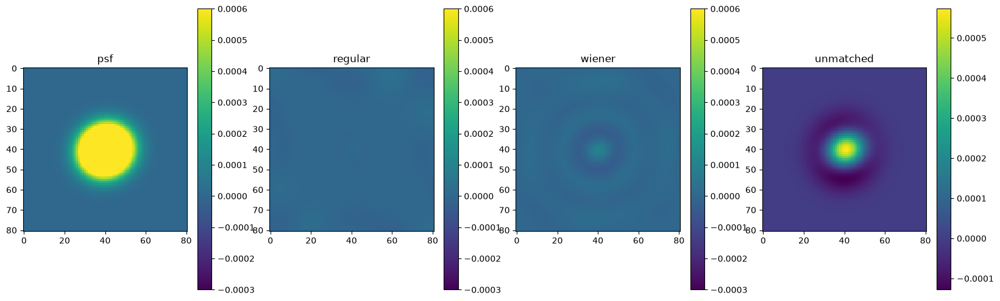

In [11]:
plt.figure(figsize=(20,6))
plt.subplot(1, 4, 1)
plt.imshow(psf2,vmin=-.0003,vmax=.0006)
plt.colorbar()
plt.title("psf")
plt.subplot(1, 4, 2)
plt.imshow(psf2-match1,vmin=-.0003,vmax=.0006)
plt.colorbar()
plt.title("regular")
plt.subplot(1,4,3)
plt.imshow(psf2-match2,vmin=-.0003,vmax=.0006)
plt.colorbar()
plt.title("wiener")
plt.subplot(1,4,4)
plt.imshow(psf2-psf1)
plt.colorbar()
plt.title("unmatched")

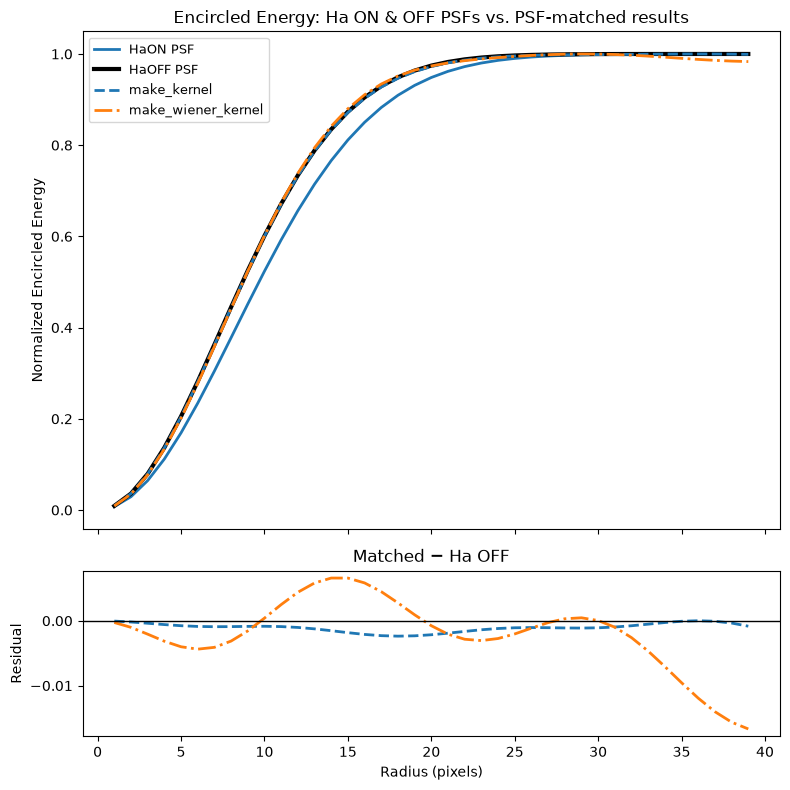

In [12]:
xycen = (40.0, 40.0)
radii = np.arange(1, 40)

cog_ch1 = CurveOfGrowth(psf1, xycen, radii)
cog_ch4 = CurveOfGrowth(psf2, xycen, radii)
cog_m1 = CurveOfGrowth(match1, xycen, radii)
cog_m2 = CurveOfGrowth(match2, xycen, radii)


for cog in [cog_ch1, cog_ch4, cog_m1, cog_m2]:
    cog.normalize()

labels = [
    'make_kernel',
    'make_wiener_kernel'
]
cogs_matched = [cog_m1, cog_m2]
ls_list = ['--', '-.']

fig, (ax_top, ax_bot) = plt.subplots(
    nrows=2, figsize=(8, 8),
    gridspec_kw={'height_ratios': [3, 1]},
    sharex=True,
)

# Main panel
cog_ch1.plot(ax=ax_top, label='HaON PSF', lw=2,
             color='C0', ls='-')
cog_ch4.plot(ax=ax_top, label='HaOFF PSF', lw=3,
             color='k')
for cog, label, ls in zip(cogs_matched, labels, ls_list):
    cog.plot(ax=ax_top, label=label, lw=2, ls=ls)
ax_top.set_ylabel('Normalized Encircled Energy')
ax_top.set_title(
    'Encircled Energy: Ha ON & OFF PSFs vs. PSF-matched results')
ax_top.legend(fontsize=9)
ax_top.set_xlabel('')

# Residual subpanel (matched - ch4)
for cog, label, ls in zip(cogs_matched, labels, ls_list):
    resid = cog.profile - cog_ch4.profile
    ax_bot.plot(cog.radius, resid, lw=2, ls=ls, label=label)
ax_bot.axhline(0, color='k', lw=1, ls='-')
ax_bot.set_xlabel('Radius (pixels)')
ax_bot.set_ylabel('Residual')
ax_bot.set_title('Matched $-$ Ha OFF')

fig.tight_layout()


Text(0.5, 1.0, 'Subtracted')

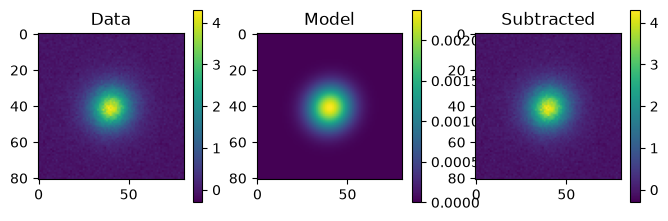

In [13]:
plt.figure(figsize=(8, 2.5))
plt.subplot(1, 3, 1)
plt.imshow(starbox1-np.median(starbox1))
plt.colorbar()
plt.title("Data")
plt.subplot(1, 3, 2)
plt.imshow(psf1)
plt.colorbar()
plt.title("Model")
plt.subplot(1, 3, 3)
plt.imshow(starbox1-np.median(starbox1)-psf1)
plt.colorbar()
plt.title("Subtracted")

Text(0.5, 1.0, 'Model')

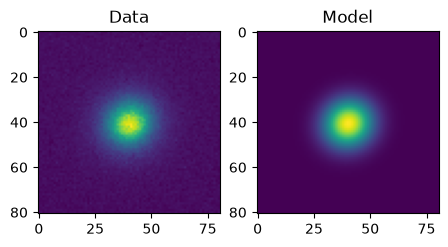

In [14]:
plt.figure(figsize=(8, 2.5))
plt.subplot(1, 3, 1)
plt.imshow(starbox2)
plt.title("Data")
plt.subplot(1, 3, 2)
plt.imshow(psf2)
plt.title("Model")

In [15]:
kernel1 = make_kernel(psf1,psf2)
kernel2 = make_wiener_kernel(psf1,psf2)
print(np.sum(kernel1))
print(np.sum(kernel2))



1.0
1.0


Text(0.5, 1.0, 'make_kernel')

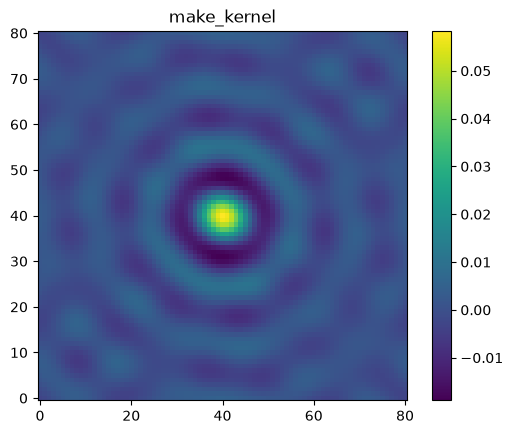

In [16]:
plt.imshow(kernel1, origin='lower')
plt.colorbar()
plt.title('make_kernel')

Text(0.5, 1.0, 'make_wiener_kernel')

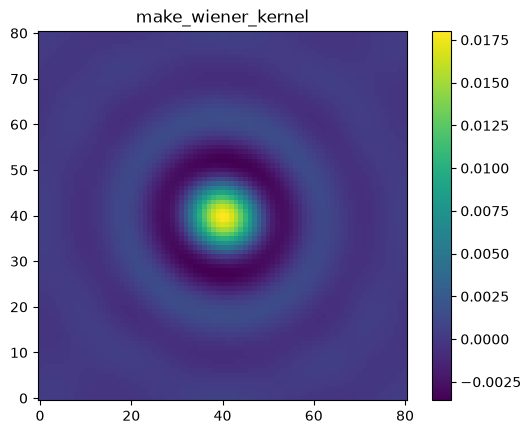

In [17]:
plt.imshow(kernel2, origin='lower')
plt.colorbar()
plt.title('make_wiener_kernel')

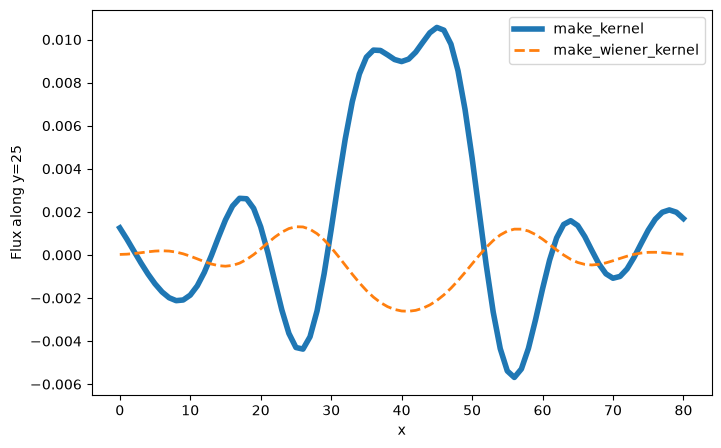

In [18]:
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(kernel1[25, :], label='make_kernel', lw=4)
ax.plot(kernel2[25, :], label='make_wiener_kernel', lw=2, ls='--')
ax.set_xlabel('x')
ax.set_ylabel('Flux along y=25')
ax.legend()
#ax.set_ylim((0.0, 0.011))

In [19]:
d = {'Audi':100 , 'BMW':1292, 'Jaguar': 210000, 'Hyundai' : 88}
res = max(d, key=d.get)
type(res)

str

In [20]:
df = pd.DataFrame(columns=('filter', 'fwhm', 'psf'))

In [21]:
df

,filter,fwhm,psf


In [22]:
data = []
data.append(['B',2,3,])

df = pd.DataFrame(data, columns=['filt', 'fwhm', 'psf'])

In [23]:
data.append(['V',5,6])
df = pd.DataFrame(data, columns=['filt', 'fwhm', 'psf'])

In [24]:
df

,filt,fwhm,psf
0,B,2,3
1,V,5,6


In [25]:
max_row = df.loc[df['fwhm'].idxmax()]
max_row

filt    V
fwhm    5
psf     6
Name: 1, dtype: object

In [26]:
for idx, row in df.iterrows():
    if row.filt == max_row.filt:
        print('hi!')

hi!


In [27]:
z = [1,2]

In [28]:
str(z)

'[1, 2]'

In [29]:
def get_psf(target_image,star_bound,background_bound,size):
    '''
    This function takes the centroid of the area specified in a reference image (intended to be one star), 
    then takes the centroid of the same area in the specified list of images, 
    and calculates the shifts required to map them to the reference image.
    Inputs:
    ref_image (str): the filepath of the reference image
    target_image (str): the filepath of the target image
    star_bound (np array): the bounds for the box of which to centroid, in [[xmin,xmax],[ymin,ymax]] form
    background_bound (np array): the bounds for the box of which to calculate the background from, in [[xmin,xmax],[ymin,ymax]] form
    Outputs:
    xy_shift (list): the x and y shifts for the target image
    '''
    
    #Calculate the shifts as compared to the reference centroid
    
    #Set our sum arrays to nothing
    img_x_weight = []
    img_y_weight = []
    img_no_weight = []
        
    #Converting the fits to a np.array
    img_fits = fits.getdata(target_image)

    #Extracing star+background patches
    img_background = img_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
    img_star = img_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]
    #Calculating the background
    bg_med = np.nanmedian(img_background)
    bg_std = np.nanstd(img_background)
    threshhold = bg_med + 3*bg_std
    print(threshhold)
    # img_reduced = img_star - bg_med
        
    #Nested for loops for x/y weighted pixels
    for x in np.arange(0,img_star.shape[1]):
        for y in np.arange(0,img_star.shape[0]):
            if img_star[x,y] > threshhold:
                x_weight = (img_star[x,y]-bg_med)*x
                y_weight = (img_star[x,y]-bg_med)*y
                no_weight= img_star[x,y]-bg_med
                img_x_weight.append(x_weight)
                img_y_weight.append(y_weight)
                img_no_weight.append(no_weight)

                
    #Calculate the image's centroid
    #print(sum(img_x_weight))
    #print(sum(img_no_weight))
    img_x_centroid = sum(img_x_weight)/sum(img_no_weight)
    img_y_centroid = sum(img_y_weight)/sum(img_no_weight)
    img_centroid = [img_y_centroid,img_x_centroid]
    print(img_centroid)
    starbox = img_star[int(img_x_centroid)-size:int(img_x_centroid)+size+1, int(img_y_centroid)-size:int(img_y_centroid)+size+1]
    plt.figure()
    plt.imshow(starbox)
    plt.scatter(size+1,size+1, color='red',s=5)
    plt.colorbar()
    plt.figure()
    img_show = img_star
    img_show[img_show<threshhold]=0
    plt.imshow(img_show,vmin=0,vmax=5)
    plt.scatter(img_y_centroid,img_x_centroid,color='r',s=5)
    plt.colorbar()


    y, x, = np.mgrid[:size*2+1, :size*2+1]
    f_init = models.Gaussian2D(amplitude = starbox[size+1,size+1]-np.median(img_background),x_mean=int(size+1), y_mean = int(size+1))
    fit_f = fitting.LevMarLSQFitter()

    f = fit_f(f_init, x, y, starbox-np.median(img_background))
    std_devs = np.array([f.x_stddev[0],f.y_stddev[0]])
    fwhm = 2.335*std_devs
    fwhm = np.sqrt(fwhm[0]**2+fwhm[1]**2)

    psf_fin = f(x,y)/np.sum(f(x,y))


    return img_centroid, psf_fin, starbox, fwhm
        
    # #Calculate the x/y shifts, print them, and add them to the list
    # x_shift = ref_centroid[0] - img_centroid[0]
    # y_shift = ref_centroid[1] - img_centroid[1]
    # xy_shift = [x_shift,y_shift]
#    # return xy_shift

4.430047259743305
[np.float64(174.2440434861206), np.float64(161.94420017922792)]


([np.float64(174.2440434861206), np.float64(161.94420017922792)],
 array([[7.01544970e-50, 4.44176967e-49, 2.71418618e-48, ...,
         1.30766634e-44, 2.55352161e-45, 4.81243873e-46],
        [4.79438188e-49, 3.04160728e-48, 1.86233042e-47, ...,
         1.08751141e-43, 2.12787648e-44, 4.01829750e-45],
        [3.16226782e-48, 2.01019951e-47, 1.23328304e-46, ...,
         8.72890205e-43, 1.71136328e-43, 3.23823139e-44],
        ...,
        [2.48620301e-41, 1.91556493e-40, 1.42442717e-39, ...,
         1.05059556e-27, 2.49653652e-28, 5.72563118e-29],
        [5.24719981e-42, 4.05095939e-41, 3.01836155e-40, ...,
         2.69827584e-28, 6.42478659e-29, 1.47643438e-29],
        [1.06882729e-42, 8.26813996e-42, 6.17292765e-41, ...,
         6.68845868e-29, 1.59576306e-29, 3.67446275e-30]], shape=(101, 101)),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0.,

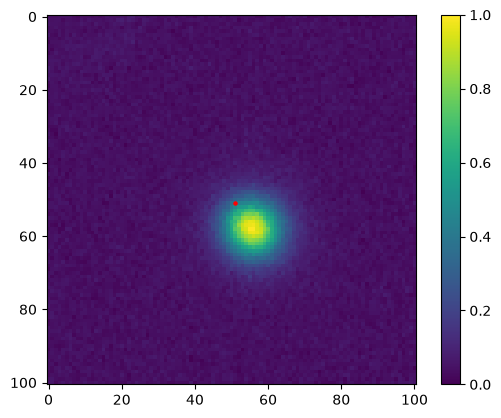

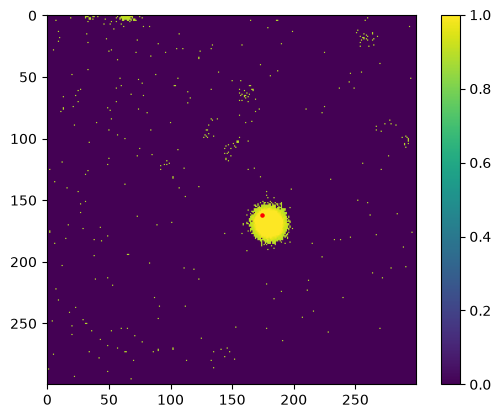

In [30]:
#star_bound = [[800,1100],[890,1190]]
#bg_bound = [[1100,1400],[800,1100]]

star_bound = [[1600,1900],[550,850]] #1740 696, 1723, 698, 1720, 704
bg_bound = [[1700,1900],[750,950]]

#cent4, psf4, starbox4, fwhm4 = get_psf(name1,star_bound,bg_bound,25)
get_psf('/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/NGC 5297/V/align_registered_V.fits',star_bound,bg_bound,50)

In [31]:
keydata = []
keydata.append(['HaON',fwhm4,psf4,'test'])
df = pd.DataFrame(keydata, columns=['filt', 'fwhm', 'psf','filepath'])


NameError: name 'fwhm4' is not defined

In [ ]:
max_row = df.loc[df['fwhm'].idxmax()]


In [ ]:
len(df)

In [32]:
def cross_image(im1, im2):
    
    """
    Calculates the x- and y-shifts between two images using cross-correlation

    Parameters:
    - im1 (np.ndarray): First image (reference)
    - im2 (np.ndarray): Second image (to be aligned)

    Returns:
    - xshift (float): The x-shift needed to align im2 w/ im1
    - yshift (float): The y-shift needed to align im2 w/ im1
    
    """

    # Ensure images have the same shape
    im1 = fits.getdata(im1)
    xshape1, yshape1 = im1.shape
    im2 = fits.getdata(im2)
    xshape2, yshape2 = im2.shape
    plt.figure()
    plt.imshow(im1,vmin=0,vmax=3)
    plt.figure()
    plt.imshow(im2,vmin=0,vmax=3)

    im1 = im1[200:xshape1-200,200:yshape1-200]
    im2 = im2[200:xshape2-200,200:yshape2-200]

    # if objname == "standard":
    #     im1 = im1[900:xshape1-900,900:yshape1-900]
    #     im2 = im2[900:xshape2-900,900:yshape2-900]        

    if im1.shape != im2.shape:
        raise ValueError(f"Image dimensions do not match: {im1.shape} vs {im2.shape}")

    # Replace NaNs with zeros and create masks
    im1_mask = ~np.isnan(im1)
    im2_mask = ~np.isnan(im2)
    if im1_mask.all == True:
        print("NO MASK (1)")
    if im2_mask.all == True:
        print("NO MASK (2)")
    im1 = np.nan_to_num(im1)
    im2 = np.nan_to_num(im2)

    # Apply Gaussian high-pass filter to remove low-frequency variations
    im1_hp = im1 - gaussian_filter(im1, sigma=5) #is usually 10
    im2_hp = im2 - gaussian_filter(im2, sigma=5)

    # Normalize intensity ranges
    im1_hp = (im1_hp - np.mean(im1_hp)) / np.std(im1_hp)
    im2_hp = (im2_hp - np.mean(im2_hp)) / np.std(im2_hp)

    # Compute shift using phase cross-correlation with masks
    shifts, error, diffphase = phase_cross_correlation(
        im1_hp, im2_hp, reference_mask=im1_mask, moving_mask=im2_mask
    )

    xshift, yshift = shifts[1], shifts[0]

    # fits.writeto(datafolder + '/cross_corr1.fits', im1_hp, overwrite=True)   
    # fits.writeto(datafolder + '/cross_corr2.fits', im2_hp, overwrite=True)
    print("******")
    print(xshift,yshift)
    print("******")
    return [xshift, yshift]

In [33]:
im_OFF = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaOFF/convolved_HaOFF.fits'
im_B = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaON/convolved_HaON.fits'

******
-1.0 -8.0
******


[np.float64(-1.0), np.float64(-8.0)]

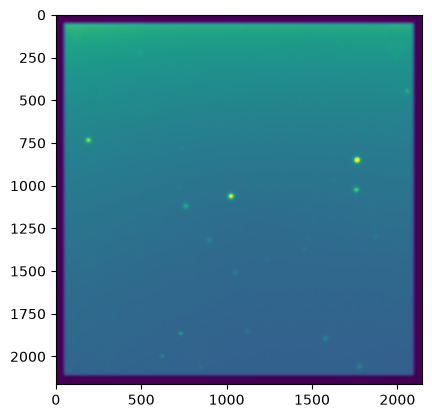

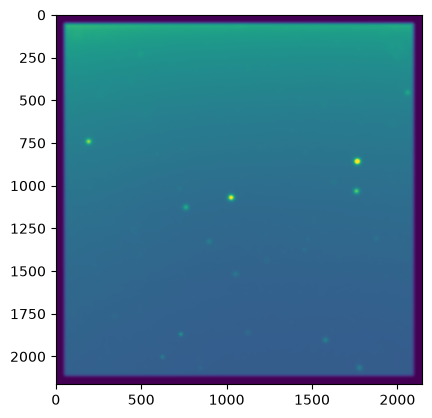

In [34]:
cross_image(im_B,im_OFF)

In [35]:
def centroid_one_star(ref_image,target_image,star_bound,background_bound):
    '''
    This function takes the centroid of the area specified in a reference image (intended to be one star), 
    then takes the centroid of the same area in the specified list of images, 
    and calculates the shifts required to map them to the reference image.
    Inputs:
    ref_image (str): the filepath of the reference image
    target_image (str): the filepath of the target image
    star_bound (np array): the bounds for the box of which to centroid, in [[xmin,xmax],[ymin,ymax]] form
    background_bound (np array): the bounds for the box of which to calculate the background from, in [[xmin,xmax],[ymin,ymax]] form
    Outputs:
    xy_shift (list): the x and y shifts for the target image
    '''
    ref_fits = fits.getdata(ref_image)
    #Extracts reference star bounds and background
    #star_bound = star_bound.astype(int)
    #background_bound = background_bound.astype(int)
    ref_background = ref_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
    ref_star = ref_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]
    
    #First find the background of the reference
    ref_med = np.median(ref_background)
    ref_std = np.std(ref_background)
    ref_threshhold = ref_med + 3*ref_std    
    #Now set up the array for our weighted/unweighted pixels
    ref_x_weight = []
    ref_y_weight = []
    ref_no_weight = []

     #Nested for loops for x/y weighted pixels
    for y in np.arange(0,ref_star.shape[1]):
        for x in np.arange(0,ref_star.shape[0]):
            if ref_star[y,x] > ref_threshhold:
                x_weight = (ref_star[y,x]-ref_med)*x
                y_weight = (ref_star[y,x]-ref_med)*y
                no_weight= ref_star[y,x]-ref_med
                ref_x_weight.append(x_weight)
                ref_y_weight.append(y_weight)
                ref_no_weight.append(no_weight)


    #Calculate the reference image's centroid 
    ref_x_centroid = sum(ref_x_weight)/sum(ref_no_weight)
    ref_y_centroid = sum(ref_y_weight)/sum(ref_no_weight)
    ref_centroid = [ref_y_centroid,ref_x_centroid]
    
    #Calculate the shifts as compared to the reference centroid
    
    #Set our sum arrays to nothing
    img_x_weight = []
    img_y_weight = []
    img_no_weight = []
        
    #Converting the fits to a np.array
    img_fits = fits.getdata(target_image)

    #Extracing star+background patches
    img_background = img_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
    img_star = img_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]

    img_med = np.median(img_background)
    img_std = np.std(img_background)
    img_threshhold = img_med + 4*img_std
        
    #Nested for loops for x/y weighted pixels
    for y in np.arange(0,img_star.shape[1]):
        for x in np.arange(0,img_star.shape[0]):
            if img_star[y,x] > img_threshhold:
                x_weight = (img_star[y,x]-img_med)*x
                y_weight = (img_star[y,x]-img_med)*y
                no_weight= img_star[y,x]-img_med
                img_x_weight.append(x_weight)
                img_y_weight.append(y_weight)
                img_no_weight.append(no_weight)
                
    #Calculate the image's centroid
    # print(sum(img_x_weight))
    # print(sum(img_no_weight))
    img_x_centroid = sum(img_x_weight)/sum(img_no_weight)
    img_y_centroid = sum(img_y_weight)/sum(img_no_weight)
    img_centroid = [img_y_centroid,img_x_centroid]
        
    #Calculate the x/y shifts, print them, and add them to the list
    x_shift = ref_centroid[1] - img_centroid[1]
    y_shift = ref_centroid[0] - img_centroid[0]
    xy_shift = [x_shift,y_shift]

    plt.figure()
    plt.imshow(img_star)
    plt.scatter(img_x_centroid,img_y_centroid, color = 'orange')
    plt.scatter(img_x_centroid+x_shift,img_y_centroid+y_shift,color='red')
    plt.colorbar()
    plt.figure()
    plt.imshow(ref_star)
    plt.scatter(ref_x_centroid,ref_y_centroid, color = 'orange')
    plt.colorbar()
    plt.figure()
    plt.imshow(img_star-ref_star)
    plt.scatter(img_x_centroid,img_y_centroid, color = 'orange')
    plt.scatter(ref_x_centroid,ref_y_centroid, color = 'red')
    plt.colorbar()





    return xy_shift


In [36]:
star_bound = [[800,1100],[890,1190]]
bg_bound = [[1100,1400],[800,1100]]

im_OFF = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaOFF/registered_New H Alpha (Off).fits'
im_ON = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaON/registered_New H Alpha (On).fits'
im_B = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/B/registered_B.fits'


im_conOFF = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaOFF/convolved_HaOFF.fits'
im_conON = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/HaON/convolved_HaON.fits'
im_B = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20250319/standard/B/registered_B.fits'


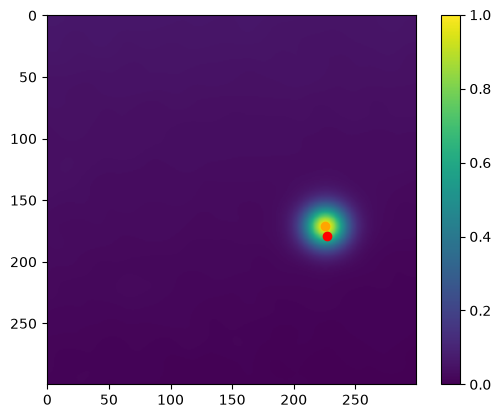

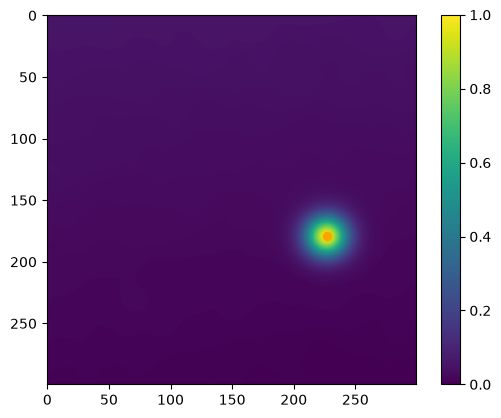

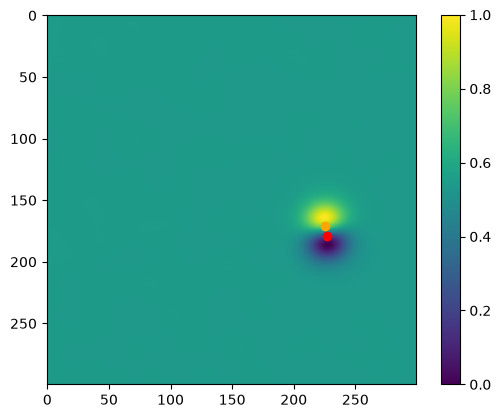

In [37]:
xy_shift = centroid_one_star(im_conOFF,im_conON,star_bound,bg_bound)


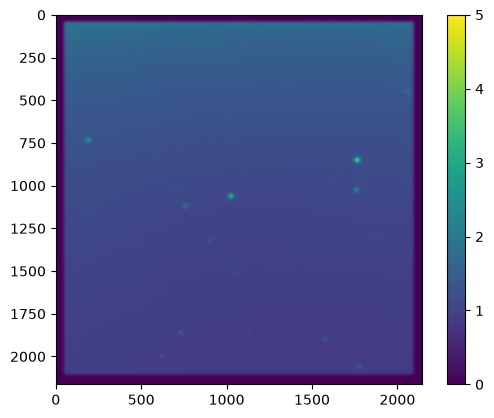

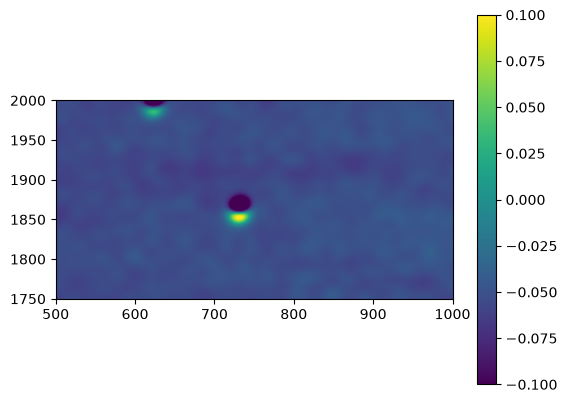

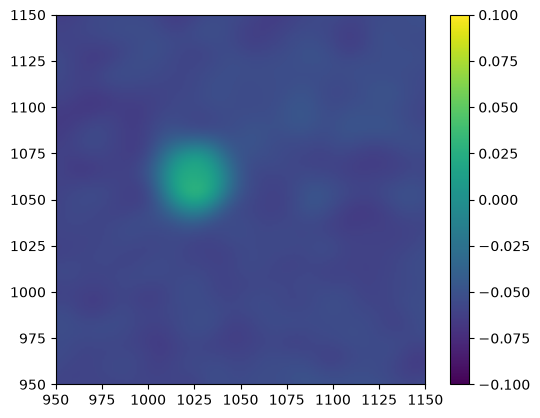

In [38]:
file = im_conOFF
image = fits.getdata(file)
image_header = fits.getheader(file)
original_shape = image.shape
#Removing artifact values
image[np.isinf(image)] = 0.0
image[np.isnan(image)] = 0.0
#print(image.shape[0])
#Padding + shifting
#Need to pad up to a specific value (so that the final arrays all have the same shape)
max0 = np.max(xy_shift[0])
max1 = np.max(xy_shift[1])
#print(max0,max1)
maxall = max(max0,max1)

pad_specific = math.ceil(maxall)

#pad_specific = int((2200 - image.shape[0])/2)
#print(registered_shifts0)
#print(registered_shifts1)
padded_image = np.pad(image, pad_specific, 'constant', constant_values = 0.001)
new_image = shift(padded_image, (-1*float(xy_shift[1]),-1*float(xy_shift[0])), cval = 0.001)

pad_y, pad_x = pad_specific, pad_specific
cropped_image = new_image[pad_y: pad_y + original_shape[0], pad_x: pad_x + original_shape[1]]
plt.imshow(cropped_image,vmin=0,vmax=5)
plt.colorbar()
plt.figure()
plt.imshow(cropped_image-fits.getdata(im_conON),vmin=-.1,vmax=.1)
plt.colorbar()
plt.xlim(500,1000)
plt.ylim(1750,2000)
plt.figure()
plt.imshow(cropped_image-fits.getdata(im_conON),vmin=-.1,vmax=.1)
plt.xlim(950,1150)
plt.ylim(950,1150)
plt.colorbar()

In [39]:
loc_1 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_1/HaOFF/registered_H-Alpha Off(New).fits'
loc_2 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_2/HaOFF/registered_H-Alpha Off(New).fits'
loc_3 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_3/HaOFF/registered_H-Alpha Off(New).fits'
loc_4 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaOFF/registered_H-Alpha Off(New).fits'
loc_5 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_5/HaOFF/registered_H-Alpha Off(New).fits'
loc_6 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_6/HaOFF/registered_H-Alpha Off(New).fits'
loc_7 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_7/HaOFF/registered_H-Alpha Off(New).fits'
loc_8 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_8/HaOFF/registered_H-Alpha Off(New).fits'
loc_9 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_9/HaOFF/registered_H-Alpha Off(New).fits'
loc_10 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_10/HaOFF/registered_H-Alpha Off(New).fits'
loc_11 = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_11/HaOFF/registered_H-Alpha Off(New).fits'

loc_1a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_1/HaON/registered_H-Alpha On (New).fits'
loc_2a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_2/HaON/registered_H-Alpha On (New).fits'
loc_3a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_3/HaON/registered_H-Alpha On (New).fits'
loc_4a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaON/registered_H-Alpha On (New).fits'
loc_5a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_5/HaON/registered_H-Alpha On (New).fits'
loc_6a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_6/HaON/registered_H-Alpha On (New).fits'
loc_7a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_7/HaON/registered_H-Alpha On (New).fits'
loc_8a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_8/HaON/registered_H-Alpha On (New).fits'
loc_9a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_9/HaON/registered_H-Alpha On (New).fits'
loc_10a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_10/HaON/registered_H-Alpha On (New).fits'
loc_11a = '/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260620/BD33_11/HaON/registered_H-Alpha On (New).fits'

In [40]:
sb1 = [[800,1100],[890,1190]]
bb1 = [[600,900],[800,1100]]
sb2 = [[1250,1550],[480,780]]
bb2 = [[950,1250],[480,780]]
sb3 = [[850,1150],[100,400]]
bb3 = [[550,850],[100,400]]
sb4 = [[500,700],[515,715]]
bb4 = [[150,450],[465,765]]
sb5 = [[70,370],[830,1130]]
bb5 = [[70,370],[530,830]]
sb6 = [[470,770],[1270,1570]]
bb6 = [[470,770],[970,1270]]
sb7 = [[850,1150],[1650,1950]]
bb7 = [[850,1150],[1350,1650]]
sb8 = [[1225,1525],[1265,1565]]
bb8 = [[1225,1525],[965,1265]]
sb9 = [[1600,1900],[880,1180]]
bb9 = [[1600,1900],[580,880]]
sb10 = [[50,350],[100,400]]
bb10 = [[800,1100],[100,400]]
sb11 = [[1600,1900],[100,400]]
bb11 = [[800,1100],[100,400]]

1.8503305327625663
[np.float64(189.87414396527495), np.float64(98.69499297742352)]
2.0531780592584585
[np.float64(139.05096154524244), np.float64(144.7392392190238)]
2.4477475049019115
[np.float64(148.49291032567754), np.float64(150.9601617742876)]
2.0435745728983177
[np.float64(99.60186285755336), np.float64(97.06517714886186)]
2.184846988073429
[np.float64(144.80965795066365), np.float64(151.4623080696092)]
0.9886281905815137
[np.float64(149.55114504088075), np.float64(150.9594296546985)]
0.8865430754026171
[np.float64(144.94488354217225), np.float64(152.93648772156598)]
0.959392520896367
[np.float64(151.9963569660158), np.float64(147.13186046021633)]
1.2186999989895604
[np.float64(152.30869584845658), np.float64(144.0287382920646)]
1.6332895286902924
[np.float64(153.51763860431427), np.float64(135.47975785303785)]
1.6975578279595203
[np.float64(157.69125577787034), np.float64(149.16710881494177)]


/var/folders/th/82vh89jd0lj1tv88p7hjcsb00000gn/T/ipykernel_21755/2824060099.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


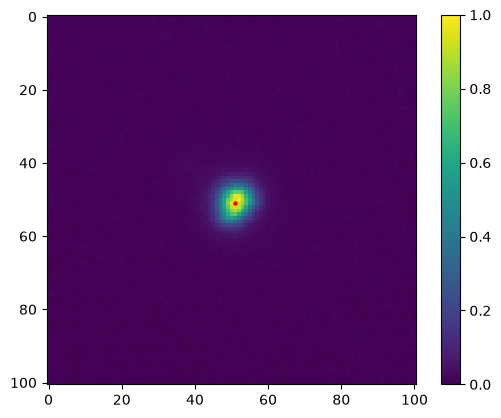

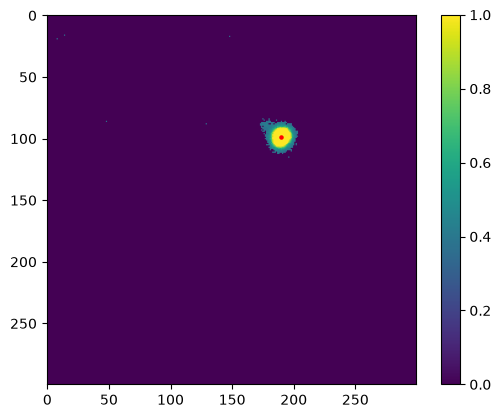

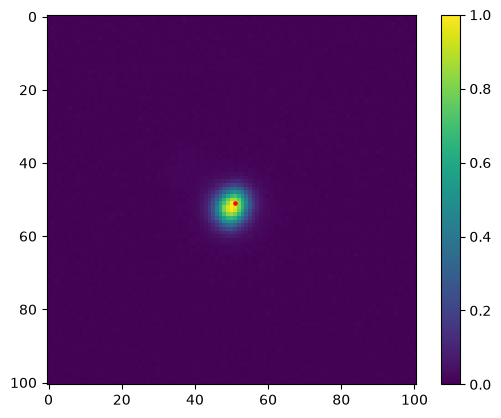

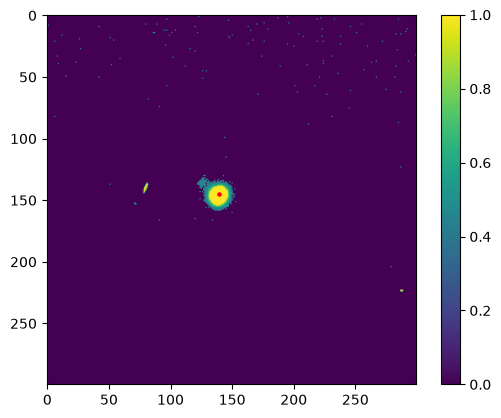

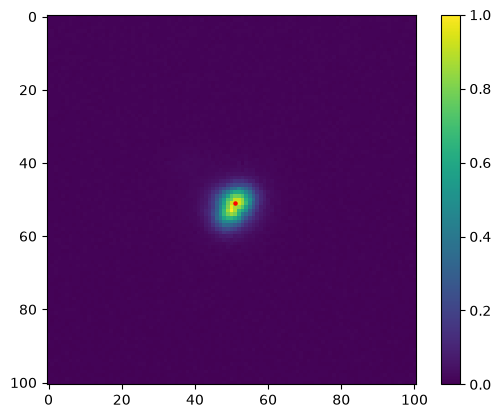

...

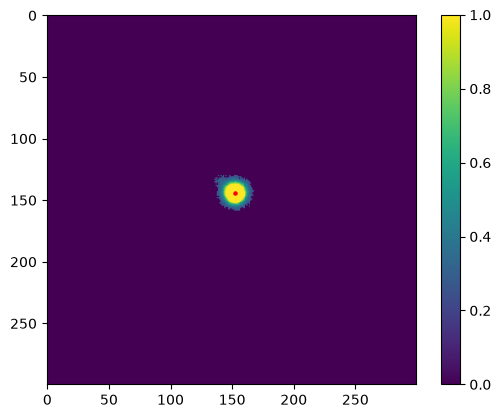

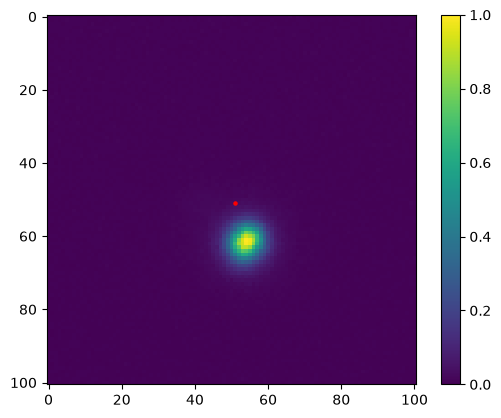

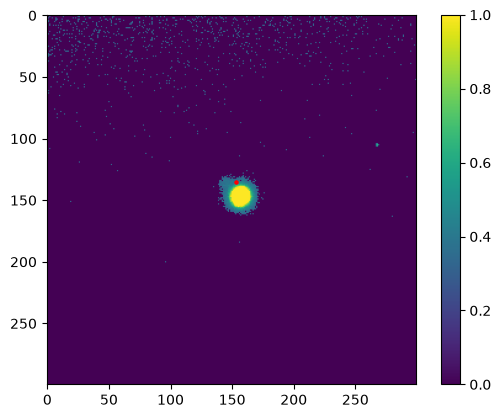

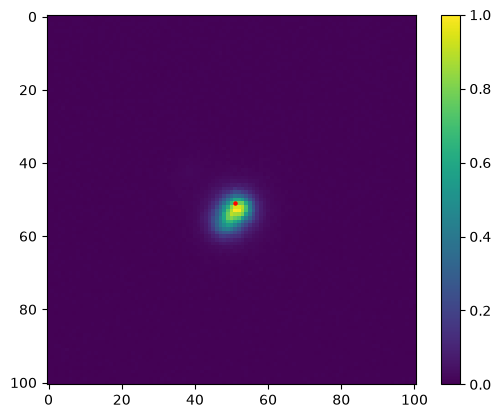

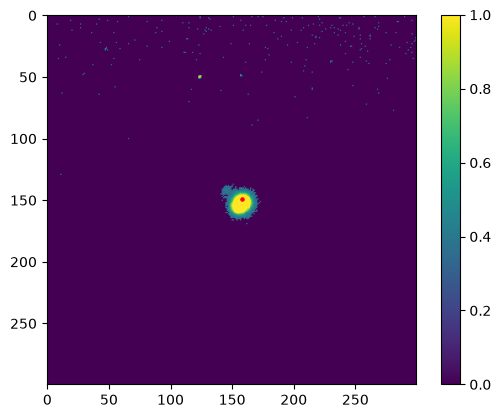

In [41]:
cent1, psf1, starbox1, fwhm1 = get_psf(loc_1,sb1,bb1,50)
cent2, psf2, starbox2, fwhm2 = get_psf(loc_2,sb2,bb2,50)
cent3, psf3, starbox3, fwhm3 = get_psf(loc_3,sb3,bb3,50)
cent4, psf4, starbox4, fwhm4 = get_psf(loc_4,sb4,bb4,50)
cent5, psf5, starbox5, fwhm5 = get_psf(loc_5,sb5,bb5,50)
cent6, psf6, starbox6, fwhm6 = get_psf(loc_6,sb6,bb6,50)
cent7, psf7, starbox7, fwhm7 = get_psf(loc_7,sb7,bb7,50)
cent8, psf8, starbox8, fwhm8 = get_psf(loc_8,sb8,bb8,50)
cent9, psf9, starbox9, fwhm9 = get_psf(loc_9,sb9,bb9,50)
cent10, psf10, starbox10, fwhm10 = get_psf(loc_10,sb10,bb10,50)
cent11, psf11, starbox11, fwhm11 = get_psf(loc_11,sb11,bb11,50)

In [42]:
print(fwhm1,fwhm2,fwhm3,fwhm4,fwhm5,fwhm6,fwhm7,fwhm8,fwhm9,fwhm10,fwhm11)

11.251042406653115 10.620088500051233 11.478330312235503 11.725476779990139 12.703074292229681 10.672918815793464 10.776587633679696 11.274978223419563 12.570316250276846 11.737739246718382 10.967448027914145


1.8501094478385205
[np.float64(195.7292422208758), np.float64(116.82378214828495)]
2.013137393894879
[np.float64(138.48569726816464), np.float64(144.87984473804775)]
2.370676658190943
[np.float64(148.98376365282832), np.float64(149.7541048263108)]
2.107314107522192
[np.float64(100.26507984547042), np.float64(96.83677058828403)]
2.0162112080711174
[np.float64(146.12054413081316), np.float64(151.34317710254746)]
0.9377977478464081
[np.float64(149.7633038655952), np.float64(151.00187875181052)]
0.8095716595001123
[np.float64(144.33384018523034), np.float64(152.91299555243404)]
1.0218101696152018
[np.float64(153.57990360774724), np.float64(147.1045334816594)]
1.133523144797729
[np.float64(154.31227655034655), np.float64(143.7243278282776)]
1.5261165999499908
[np.float64(154.96925229995037), np.float64(139.28912645444024)]
1.5842647225468447
[np.float64(156.59194083696428), np.float64(147.7357604191183)]


/var/folders/th/82vh89jd0lj1tv88p7hjcsb00000gn/T/ipykernel_21755/2824060099.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


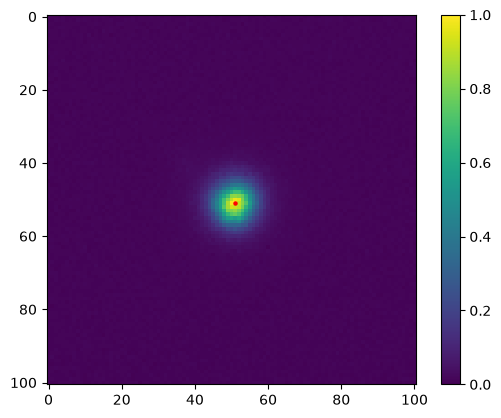

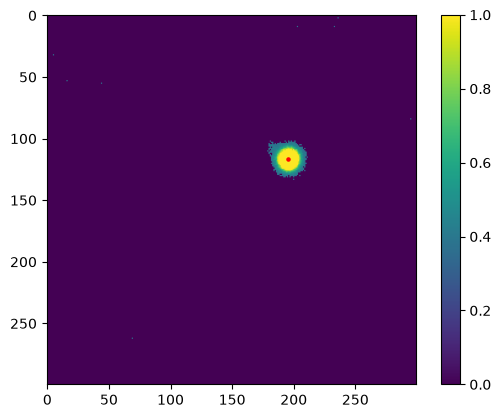

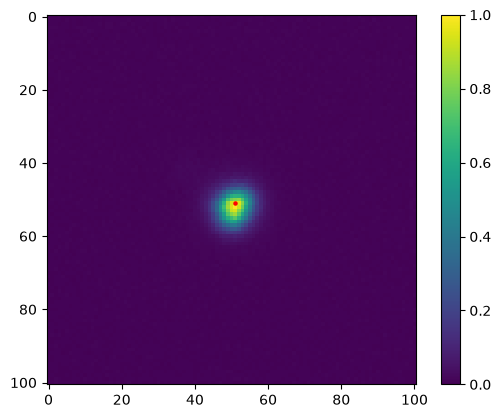

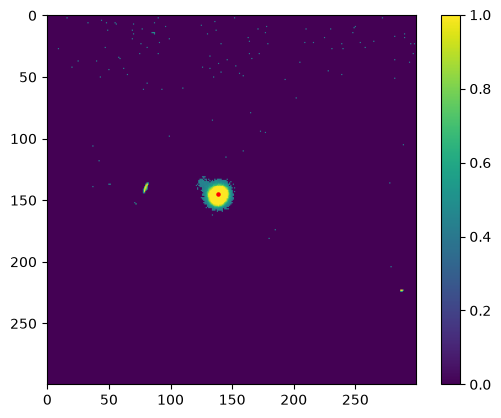

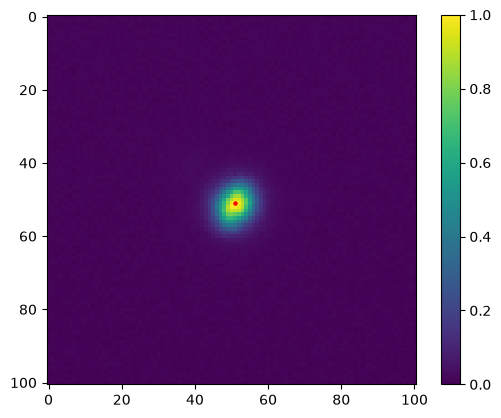

...

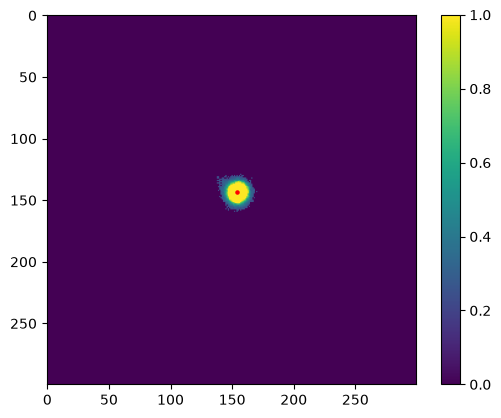

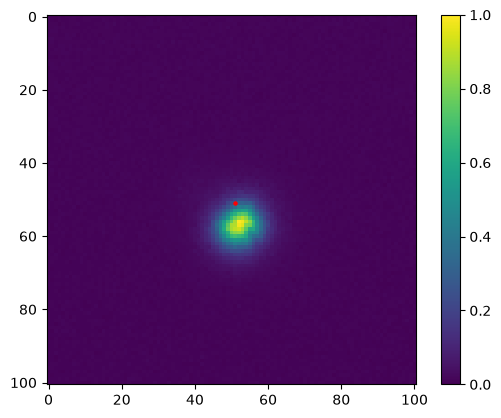

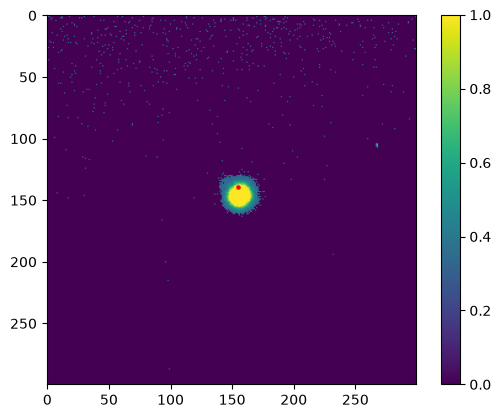

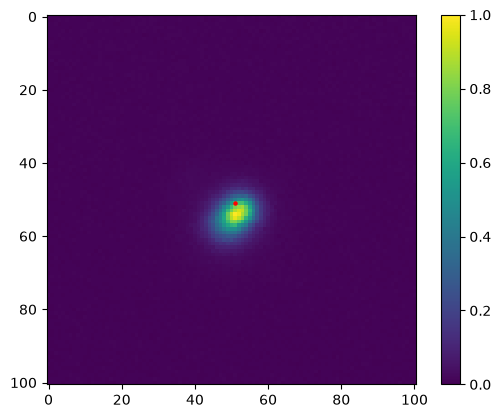

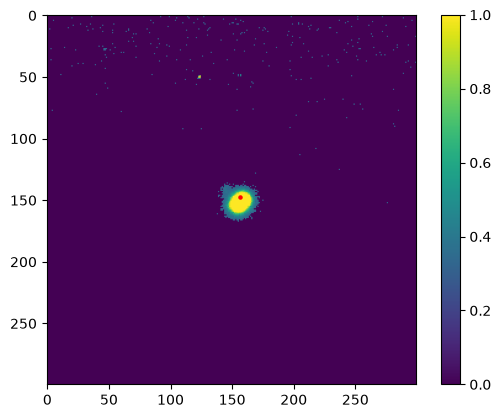

In [43]:
cent1a, psf1a, starbox1a, fwhm1a = get_psf(loc_1a,sb1,bb1,50)
cent2a, psf2a, starbox2a, fwhm2a = get_psf(loc_2a,sb2,bb2,50)
cent3a, psf3a, starbox3a, fwhm3a = get_psf(loc_3a,sb3,bb3,50)
cent4a, psf4a, starbox4a, fwhm4a = get_psf(loc_4a,sb4,bb4,50)
cent5a, psf5a, starbox5a, fwhm5a = get_psf(loc_5a,sb5,bb5,50)
cent6a, psf6a, starbox6a, fwhm6a = get_psf(loc_6a,sb6,bb6,50)
cent7a, psf7a, starbox7a, fwhm7a = get_psf(loc_7a,sb7,bb7,50)
cent8a, psf8a, starbox8a, fwhm8a = get_psf(loc_8a,sb8,bb8,50)
cent9a, psf9a, starbox9a, fwhm9a = get_psf(loc_9a,sb9,bb9,50)
cent10a, psf10a, starbox10a, fwhm10a = get_psf(loc_10a,sb10,bb10,50)
cent11a, psf11a, starbox11a, fwhm11a = get_psf(loc_11a,sb11,bb11,50)

In [44]:
print(fwhm1a,fwhm2a,fwhm3a,fwhm4a,fwhm5a,fwhm6a,fwhm7a,fwhm8a,fwhm9a,fwhm10a,fwhm11a)

13.37696092393776 11.352405261210617 12.455596603880998 11.446582800551749 12.7327358035119 11.683636831670443 11.623563766382139 12.237625530508579 13.578751683257787 13.895429009438647 12.466277270655201


2.107314107522192
[np.float64(100.26507984547042), np.float64(96.83677058828403)]


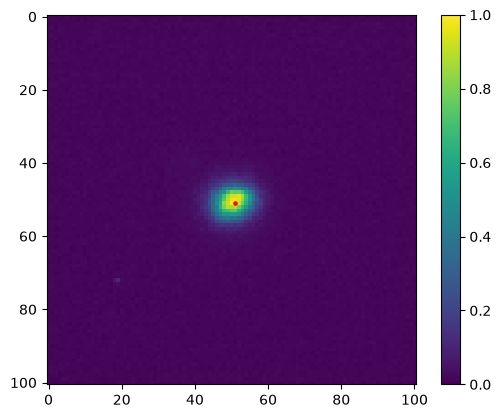

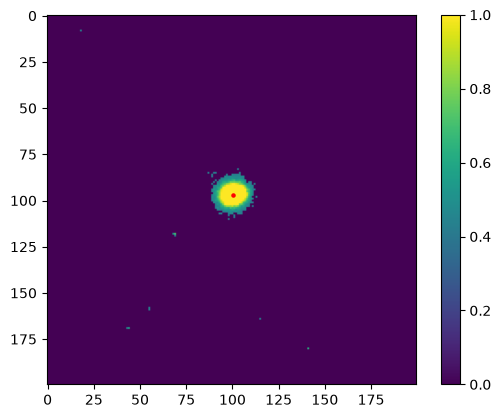

In [45]:
cent4a, psf4a, starbox4a, fwhm4a = get_psf(loc_4a,sb4,bb4,50)


In [46]:
def cross_image2(im1, im2):
    
    """
    Calculates the x- and y-shifts between two images using cross-correlation

    Parameters:
    - im1 (np.ndarray): First image (reference)
    - im2 (np.ndarray): Second image (to be aligned)

    Returns:
    - xshift (float): The x-shift needed to align im2 w/ im1
    - yshift (float): The y-shift needed to align im2 w/ im1
    
    """

    # Ensure images have the same shape
    im1 = fits.getdata(im1)
    xshape1, yshape1 = im1.shape
    im2 = fits.getdata(im2)
    xshape2, yshape2 = im2.shape
    plt.figure()
    plt.imshow(im1,vmin=0,vmax=5)
    plt.figure()
    plt.imshow(im2,vmin=0,vmax=5)

    im1 = im1[200:xshape1-200,200:yshape1-200]
    im2 = im2[200:xshape2-200,200:yshape2-200]

    # if objname == "standard":
    #     im1 = im1[900:xshape1-900,900:yshape1-900]
    #     im2 = im2[900:xshape2-900,900:yshape2-900]        

    if im1.shape != im2.shape:
        raise ValueError(f"Image dimensions do not match: {im1.shape} vs {im2.shape}")

    # Replace NaNs with zeros and create masks
    im1_mask = ~np.isnan(im1)
    im2_mask = ~np.isnan(im2)
    if im1_mask.all == True:
        print("NO MASK (1)")
    if im2_mask.all == True:
        print("NO MASK (2)")
    im1 = np.nan_to_num(im1)
    im2 = np.nan_to_num(im2)

    # Apply Gaussian high-pass filter to remove low-frequency variations
    im1_hp = im1 - gaussian_filter(im1, sigma=2) #is usually 10
    im2_hp = im2 - gaussian_filter(im2, sigma=2)

    # Normalize intensity ranges
    im1_hp = (im1_hp - np.mean(im1_hp)) / np.std(im1_hp)
    im2_hp = (im2_hp - np.mean(im2_hp)) / np.std(im2_hp)
    plt.figure()
    plt.imshow(im1_hp,vmin=-5,vmax=1)
    plt.colorbar()
    plt.figure()
    plt.imshow(im2_hp,vmin=-5,vmax=1)
    plt.colorbar()
    # Compute shift using phase cross-correlation with masks
    shifts, error, diffphase = phase_cross_correlation(
        im1_hp, im2_hp, reference_mask=im1_mask, moving_mask=im2_mask
    )

    xshift, yshift = shifts[1], shifts[0]

    # fits.writeto(datafolder + '/cross_corr1.fits', im1_hp, overwrite=True)   
    # fits.writeto(datafolder + '/cross_corr2.fits', im2_hp, overwrite=True)
    print("******")
    print(xshift,yshift)
    print("******")
    return [xshift, yshift]

******
0.0 0.0
******


[np.float64(0.0), np.float64(0.0)]

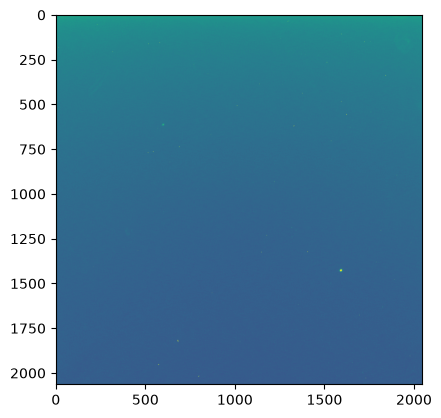

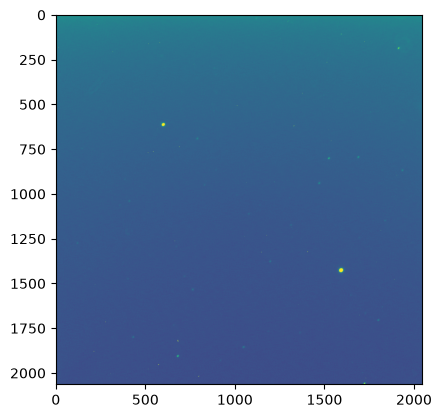

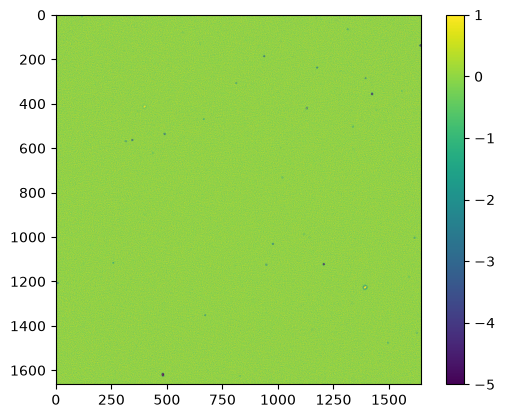

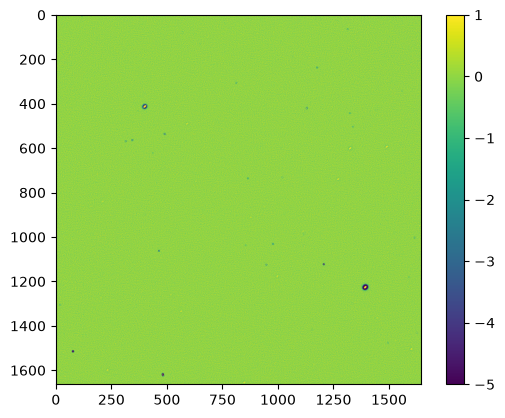

In [47]:
cross_image2("/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaON/n_fdb_20260619.046.fits","/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaON/n_fdb_20260619.042.fits")

In [48]:
def centroid_one_star(ref_image,target_image,star_bound,background_bound):
    '''
    This function takes the centroid of the area specified in a reference image (intended to be one star), 
    then takes the centroid of the same area in the specified list of images, 
    and calculates the shifts required to map them to the reference image.
    Inputs:
    ref_image (str): the filepath of the reference image
    target_image (str): the filepath of the target image
    star_bound (np array): the bounds for the box of which to centroid, in [[xmin,xmax],[ymin,ymax]] form
    background_bound (np array): the bounds for the box of which to calculate the background from, in [[xmin,xmax],[ymin,ymax]] form
    Outputs:
    xy_shift (list): the x and y shifts for the target image
    '''
    ref_fits = fits.getdata(ref_image)
    #Extracts reference star bounds and background
    #star_bound = star_bound.astype(int)
    #background_bound = background_bound.astype(int)
    ref_background = ref_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
    ref_star = ref_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]
    
    #First find the background of the reference
    ref_med = np.median(ref_background)
    ref_std = np.std(ref_background)
    ref_threshhold = ref_med + 3*ref_std  
    print(ref_threshhold)
  
    #Now set up the array for our weighted/unweighted pixels
    ref_x_weight = []
    ref_y_weight = []
    ref_no_weight = []

     #Nested for loops for x/y weighted pixels
    for y in np.arange(0,ref_star.shape[1]):
        for x in np.arange(0,ref_star.shape[0]):
            if ref_star[y,x] > ref_threshhold:
                x_weight = (ref_star[y,x]-ref_med)*x
                y_weight = (ref_star[y,x]-ref_med)*y
                no_weight= ref_star[y,x]-ref_med
                ref_x_weight.append(x_weight)
                ref_y_weight.append(y_weight)
                ref_no_weight.append(no_weight)


    #Calculate the reference image's centroid 
    ref_x_centroid = sum(ref_x_weight)/sum(ref_no_weight)
    ref_y_centroid = sum(ref_y_weight)/sum(ref_no_weight)
    ref_centroid = [ref_y_centroid,ref_x_centroid]
    
    #Calculate the shifts as compared to the reference centroid
    
    #Set our sum arrays to nothing
    img_x_weight = []
    img_y_weight = []
    img_no_weight = []
        
    #Converting the fits to a np.array
    img_fits = fits.getdata(target_image)

    #Extracing star+background patches
    img_background = img_fits[background_bound[1][0]:background_bound[1][1],background_bound[0][0]:background_bound[0][1]]
    img_star = img_fits[star_bound[1][0]:star_bound[1][1],star_bound[0][0]:star_bound[0][1]]

    img_med = np.median(img_background)
    img_std = np.std(img_background)
    img_threshhold = img_med + 4*img_std
    print(img_threshhold)
    #Nested for loops for x/y weighted pixels
    for y in np.arange(0,img_star.shape[1]):
        for x in np.arange(0,img_star.shape[0]):
            if img_star[y,x] > img_threshhold:
                x_weight = (img_star[y,x]-img_med)*x
                y_weight = (img_star[y,x]-img_med)*y
                no_weight= img_star[y,x]-img_med
                img_x_weight.append(x_weight)
                img_y_weight.append(y_weight)
                img_no_weight.append(no_weight)
                
    #Calculate the image's centroid
    # print(sum(img_x_weight))
    # print(sum(img_no_weight))
    img_x_centroid = sum(img_x_weight)/sum(img_no_weight)
    img_y_centroid = sum(img_y_weight)/sum(img_no_weight)
    img_centroid = [img_y_centroid,img_x_centroid]
        
    #Calculate the x/y shifts, print them, and add them to the list
    x_shift = ref_centroid[1] - img_centroid[1]
    y_shift = ref_centroid[0] - img_centroid[0]
    xy_shift = [x_shift,y_shift]

    plt.figure()
    plt.imshow(img_star)
    plt.scatter(img_x_centroid,img_y_centroid, color = 'orange')
    plt.scatter(img_x_centroid+x_shift,img_y_centroid+y_shift,color='red')
    plt.colorbar()
    plt.figure()
    plt.imshow(ref_star)
    plt.scatter(ref_x_centroid,ref_y_centroid, color = 'orange')
    plt.colorbar()
    plt.figure()
    plt.imshow(img_star-ref_star)
    plt.scatter(img_x_centroid,img_y_centroid, color = 'orange')
    plt.scatter(ref_x_centroid,ref_y_centroid, color = 'red')
    plt.colorbar()





    return xy_shift


2.360054356915869
2.209889485220497


[np.float64(-4.02960681821861), np.float64(0.9495292276524054)]

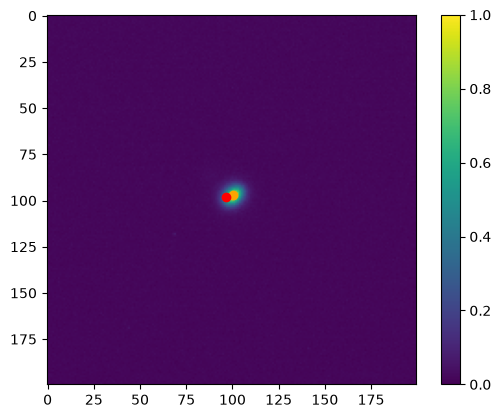

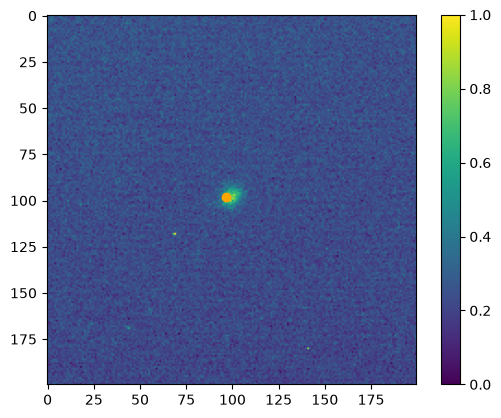

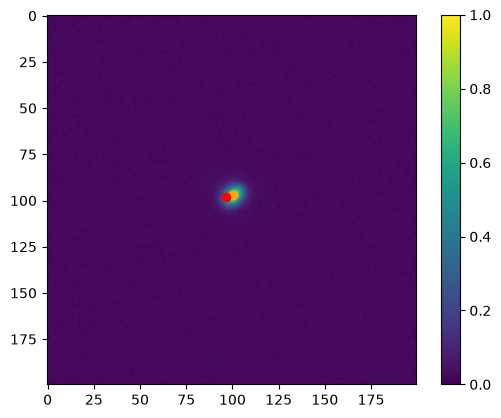

In [49]:
centroid_one_star("/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaON/n_fdb_20260619.046.fits","/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaON/n_fdb_20260619.042.fits",sb4,bb4)

2.360054356915869
[np.float64(96.2934143452897), np.float64(98.20089495214769)]


([np.float64(96.2934143452897), np.float64(98.20089495214769)],
 array([[0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
         5.60935513e-169, 4.30759419e-172, 2.62241433e-175],
        [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
         4.55349385e-165, 3.27510608e-168, 1.86745725e-171],
        [0.00000000e+000, 0.00000000e+000, 0.00000000e+000, ...,
         2.90351454e-161, 1.95597542e-164, 1.04459384e-167],
        ...,
        [4.44479190e-195, 4.26338106e-191, 3.24191446e-187, ...,
         3.22835948e-284, 4.04634814e-290, 4.02058533e-296],
        [1.17212036e-198, 1.05301292e-194, 7.49963055e-191, ...,
         1.38951160e-290, 1.63118156e-296, 1.51805362e-302],
        [2.42795381e-202, 2.04296384e-198, 1.36277959e-194, ...,
         4.69774996e-297, 5.16521967e-303, 4.50227870e-309]],
       shape=(101, 101)),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0

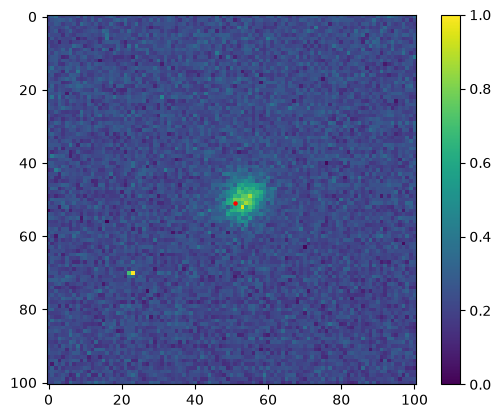

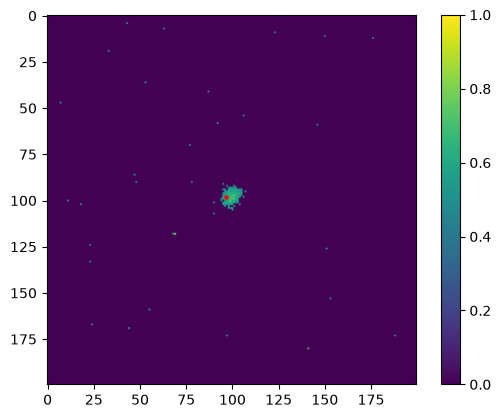

In [50]:
get_psf("/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_4/HaON/n_fdb_20260619.046.fits", sb4,bb4,size=50)

In [51]:
bg_finder = fits.getdata("/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_1/HaOFF/n_fdb_20260619.059.fits")

In [52]:
from astropy.stats import SigmaClip
from photutils.background import Background2D, MedianBackground
sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()
bkg = Background2D(bg_finder, (15, 15), filter_size=(3, 3),
                   sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)

In [53]:
print(bkg.background_median)
10.822232525276007
print(round(bkg.background_rms_median, 4))
2.0367

1.6048060182273258
0.1244


2.0367

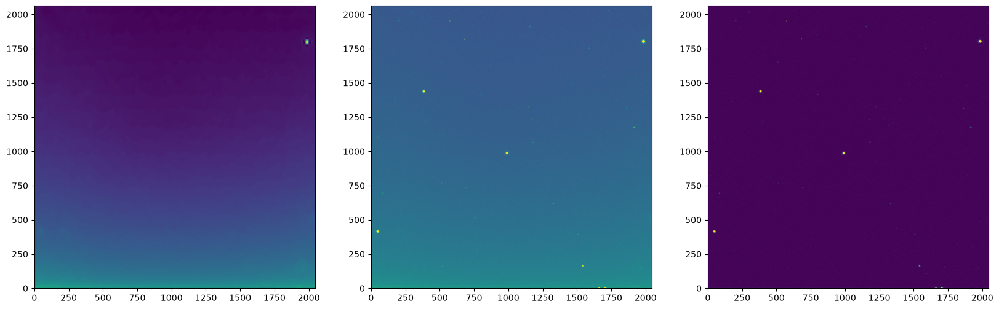

In [67]:
fig, axs = plt.subplots(1,3,figsize=(20,10))
axs[0].imshow(bkg.background, origin='lower')
axs[1].imshow(bg_finder, vmin=0,vmax=5, origin='lower')
axs[2].imshow(bg_finder-bkg.background, vmin=0,vmax=5, origin='lower')



In [72]:
def background_subtract(img):
    """
    Subtracts out the background from an image
    Inputs:
    img (str): filepath to image to be subtracted

    Outputs:
    writes subtracted image out!
    """
    data = fits.getdata(img)
    hdr = fits.getheader(img)

    sigma_clip = SigmaClip(sigma=3.0)
    bkg_estimator = MedianBackground()
    bkg = Background2D(data, (15, 15), filter_size=(3, 3),
                   sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)
    
    new_data = data-bkg.background
    print(os.path.dirname(img)+'/s_' + os.path.basename(img))
    #fits.writeto(os.path.dirname(img)+'s_' + os.path.basename(img), new_data, hdr, overwrite=True)
    return new_data

In [73]:
background_subtract("/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_1/HaOFF/n_fdb_20260619.059.fits")

/Users/samkleiman/Desktop/PERKINS_DATA_TESTING/20260619/BD33_1/HaOFF/s_n_fdb_20260619.059.fits


array([[-0.23091976,  0.15357737, -0.04037331, ...,  0.39657585,
         0.38891056,  0.18255878],
       [ 0.38626334,  0.51415991,  0.37225041, ..., -0.00505633,
         0.44707586,  0.42997445],
       [ 0.1340634 ,  0.26990508,  0.30290268, ...,  0.06123078,
         0.35994689,  0.38065346],
       ...,
       [ 0.10356772, -0.00089404,  0.04291238, ...,  0.10219699,
         0.24122602,  0.06602169],
       [ 0.11132061, -0.3879577 ,  0.04856882, ..., -0.06452111,
        -0.03166665,  0.03576483],
       [-0.26830303, -0.44147737, -0.26979132, ..., -0.011189  ,
        -0.32012741, -0.35079086]], shape=(2064, 2045))